Mutual Exclusion

In [3]:
import threading, time, random

counter = 0
violation = 0
lock = threading.Lock()

def task(use_lock=False):
    global counter, violation
    for _ in range(1000):
        if use_lock:
            with lock:
                tmp = counter
                time.sleep(random.uniform(0, 0.0001))
                counter = tmp + 1
        else:
            tmp = counter
            time.sleep(random.uniform(0, 0.0001))
            counter = tmp + 1
            if random.random() < 0.001:
                violation += 1

threads = [threading.Thread(target=task, args=(False,)) for _ in range(4)]
[t.start() for t in threads]
[t.join() for t in threads]
print("Violation (no lock):", violation)


Violation (no lock): 4


Config ready.
Saved: figs_single/A_incorrect_grants.png  (DPI=800)
Saved: figs_single/A_incorrect_grants.pdf


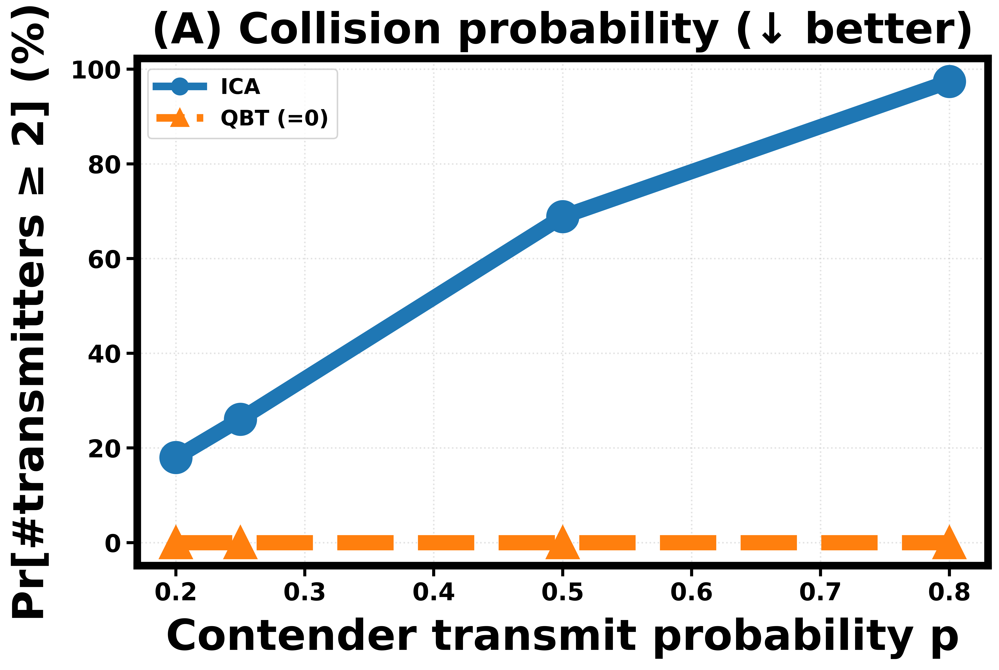

Saved: figs_single/B_throughput.png  (DPI=800)
Saved: figs_single/B_throughput.pdf


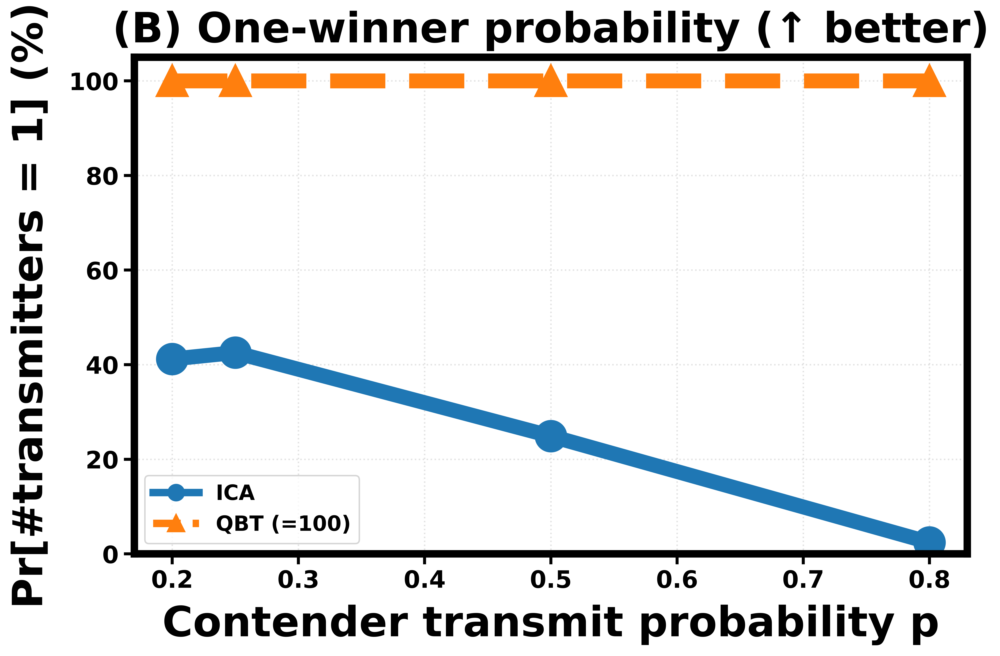

Saved: figs_single/C_idle_time.png  (DPI=800)
Saved: figs_single/C_idle_time.pdf


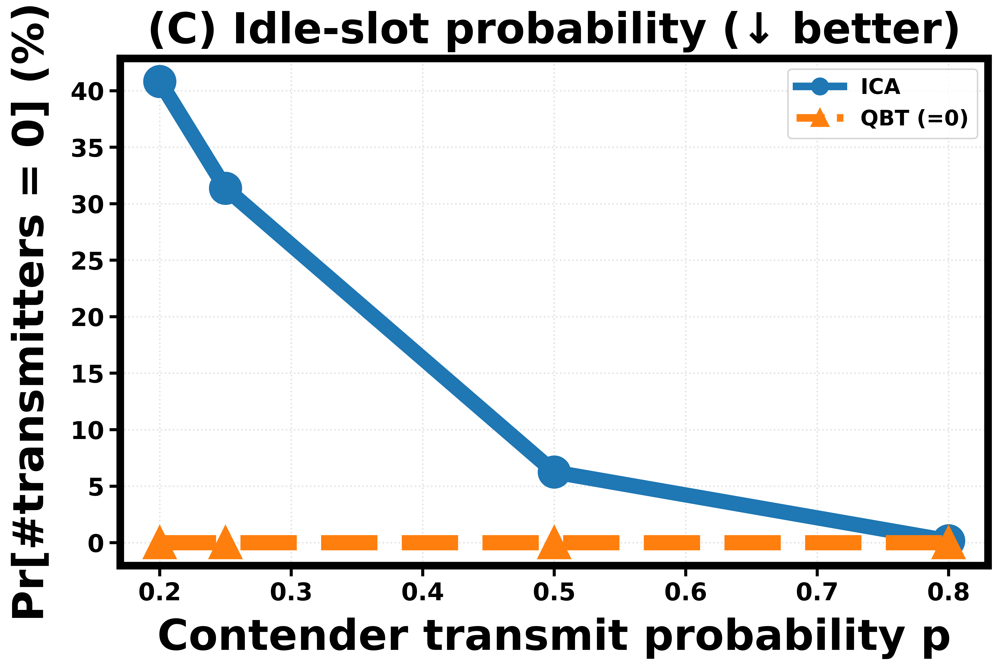

Saved: figs_single/D_long_run_fairness.png  (DPI=800)
Saved: figs_single/D_long_run_fairness.pdf


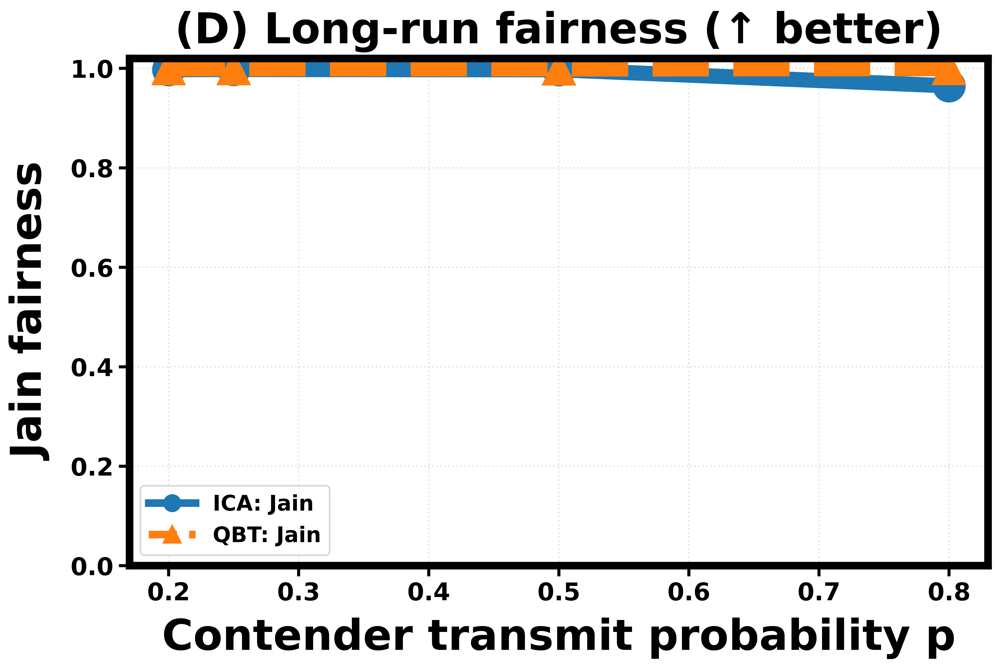

In [4]:
import os, json, math, time, csv, random, pickle
from collections import Counter
from typing import Dict, List, Tuple

import numpy as np
import matplotlib as mpl
mpl.rcParams["axes.unicode_minus"] = False   # ensure minus signs render properly
mpl.rcParams.update({
    "font.size": 16,          
    "axes.titlesize": 28,     
    "axes.labelsize": 28,     
    "xtick.labelsize": 16,    
    "ytick.labelsize": 16,
    "legend.fontsize": 16,

    "font.weight": "bold",
    "axes.titleweight": "bold",
    "axes.labelweight": "bold",

    "lines.linewidth": 10,
    "lines.markersize": 20,
    "lines.markeredgewidth": 1.8,

    "axes.linewidth": 5,       
    "xtick.major.width": 2.0,     
    "ytick.major.width": 2.0,
    "xtick.major.size": 7,        
    "ytick.major.size": 7,

    "errorbar.capsize": 5,    

    "grid.linewidth": 1.0,
})
mpl.rcParams["figure.dpi"] = 800            # on-screen DPI; saved figures set their own DPI below
import matplotlib.pyplot as plt

import pennylane as qml

# ---------------- Config ----------------
SEED      = 7
THREADS   = 4         # number of contenders
ROUNDS    = 4000      # per grid-point per repeat
P_GRID    = [0.2, 0.25, 0.5, 0.8]  # ICA attempt probabilities to scan
N_REPEATS = 7
ERR_MODE  = "ci95"    # 'std' or 'ci95' (mean ± ~95% CI)

# Output locations
SAVE_DIR     = "figs_single"
FIG_DPI      = 800
CACHE_DIR    = "cache"
CACHE_PICKLE = os.path.join(CACHE_DIR, "results.pkl")
CSV_OUT      = os.path.join(CACHE_DIR, "summary.csv")

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(CACHE_DIR, exist_ok=True)
np.random.seed(SEED)

print("Config ready.")

# ---------------- Helpers ----------------
def jain_index(counts_dict: Dict[int, int]) -> float:
    """
    Compute Jain's fairness index over a dictionary of counts per contender.
    J = (Σ x_i)^2 / (n * Σ x_i^2) with J ∈ [1/n, 1]. Higher is more fair.  [1]
    """
    xs = np.array(list(counts_dict.values()), float)
    den = len(xs) * (xs**2).sum()
    return (xs.sum()**2 / den) if den > 0 else 1.0

def mean_err(vals: List[float], mode: str = ERR_MODE) -> Tuple[float, float]:
    """
    Return (mean, error), where the error is either sample std (ddof=1) or
    an approximate 95% CI = 1.96 * (std / sqrt(n)) under normal approximation.
    """
    vals = np.asarray(vals, float); m = float(vals.mean())
    if len(vals) == 1:
        return m, 0.0
    sd = float(vals.std(ddof=1))
    if mode == "std":
        return m, sd
    sem = sd / math.sqrt(len(vals))
    return m, 1.96 * sem

# ---------------- Classical ICA ----------------
def classical_ica_rounds(p: float, rounds: int, n: int, seed: int):
    """
    Independent-coin arbitration baseline.
    In each round every contender transmits with probability p:
      k=0 → idle; k=1 → exactly one success; k≥2 → collision (incorrect multi-grant).
    Tracks outcome percentages and per-contender win counts.
    """
    rng = np.random.default_rng(seed)
    wins = Counter({i: 0 for i in range(n)})
    collisions = idle = success = 0

    for _ in range(rounds):
        attempts = rng.random(n) < p
        k = int(attempts.sum())
        if k == 0:
            idle += 1
        elif k == 1:
            idx = int(np.where(attempts)[0][0])
            wins[idx] += 1
            success += 1
        else:
            collisions += 1

    total = rounds
    return dict(
        collision_pct  = 100.0 * collisions / total,
        one_winner_pct = 100.0 * success    / total,
        idle_pct       = 100.0 * idle       / total,
        fairness_jain  = jain_index(wins),
        wins_hist      = dict(wins),
    )

# ---------------- Quantum Bell Tournament ----------------
# |Ψ⁺⟩ = (|01⟩ + |10⟩)/√2. Measuring both qubits in the Z basis yields perfect anti-correlation (01 or 10). [2]
_dev_bell = qml.device("default.qubit", wires=2, shots=1)

@qml.qnode(_dev_bell)
def bell_sample_psiplus():
    """
    Prepare |Ψ⁺⟩ from |00⟩ using a minimal circuit (X on qubit 1, H on qubit 0, then CNOT 0→1),
    and return one basis-state sample [b0, b1] in the computational (Z) basis.  [2][4]
    """
    qml.PauliX(1)
    qml.Hadamard(0)
    qml.CNOT(wires=[0, 1])
    return qml.sample(wires=[0, 1])  # shape=(2,)

def bell_pair_winner(i: int, j: int):
    """
    Run one Bell-pair election between contenders i and j.
    The qubit that reads '1' is considered the winner for that pair.
    """
    s = bell_sample_psiplus()
    if (s[0] == 1 and s[1] == 0):
        return i
    elif (s[0] == 0 and s[1] == 1):
        return j
    return None  # ideally unreachable with |Ψ⁺⟩ and shots=1

def quantum_bell_tournament_rounds(rounds: int, n: int, seed: int):
    """
    Bell-tournament (knockout) per round:
      1) shuffle active contenders,
      2) pair them, elect a unique winner per pair by sampling |Ψ⁺⟩,
      3) winners advance; if odd, last contender gets a bye; repeat until one remains.
    Collects outcome percentages, fairness via Jain index, and wall time.
    """
    rng = random.Random(seed)
    wins = Counter({i: 0 for i in range(n)})
    invalid = 0
    t0 = time.perf_counter()

    for _ in range(rounds):
        active = list(range(n))
        rng.shuffle(active)
        while len(active) > 1:
            nxt = []
            for k in range(0, len(active) - 1, 2):
                w = bell_pair_winner(active[k], active[k + 1])
                if w is None:               # defensive fallback
                    invalid += 1
                    w = active[k]
                nxt.append(w)
            if len(active) % 2 == 1:        # bye if odd
                nxt.append(active[-1])
            active = nxt
        wins[active[0]] += 1

    wall = time.perf_counter() - t0
    total = rounds
    return dict(
        collision_pct  = 100.0 * invalid / total,  # ~0 with ideal simulation
        one_winner_pct = 100.0,                    # exactly one final winner each round
        idle_pct       = 0.0,
        fairness_jain  = jain_index(wins),
        wins_hist      = dict(wins),
        runtime_s      = wall,
    )

# ---------------- Repeats & cache ----------------
def run_all():
    """
    Run ICA and Bell-tournament across P_GRID for N_REPEATS.
    Returns raw per-repeat arrays so statistics can be recomputed later without re-simulation.
    """
    ica_all = {p: {'coll': [], 'one': [], 'idle': [], 'jain': []} for p in P_GRID}
    bt_all  = {p: {'coll': [], 'one': [], 'idle': [], 'jain': [], 'rt': []} for p in P_GRID}

    for r in range(N_REPEATS):
        seed_r = SEED + 1000 * r
        for p in P_GRID:
            ica = classical_ica_rounds(p, ROUNDS, THREADS, seed_r + 37)
            bt  = quantum_bell_tournament_rounds(ROUNDS, THREADS, seed_r + 73)
            for key, map_ in [('coll', 'collision_pct'),
                              ('one',  'one_winner_pct'),
                              ('idle', 'idle_pct'),
                              ('jain', 'fairness_jain')]:
                ica_all[p][key].append(ica[map_])
                bt_all [p][key].append(bt [map_])
            bt_all[p]['rt'].append(bt['runtime_s'])
    return ica_all, bt_all

def mean_err_dict(D: Dict):
    """Convert {p: {metric: [values...]}} → {p: {metric: (mean, err)}} using mean_err."""
    return {p: {k: mean_err(D[p][k]) for k in D[p].keys()} for p in P_GRID}

def save_pickle(obj, path: str):
    """Persist any Python object to a pickle file (used for caching raw arrays)."""
    os.makedirs(os.path.dirname(path), exist_ok=True)
    with open(path, "wb") as f:
        pickle.dump(obj, f)

def load_pickle(path: str):
    """Load a cached pickle object (raw arrays + metadata)."""
    with open(path, "rb") as f:
        return pickle.load(f)

# ---------------- CSV summary ----------------
def write_csv_summary(ica_m, bt_m, csv_out: str):
    """
    Write a compact table (means ± error) for all metrics at each p in P_GRID.
    Also prints a console-friendly table for quick inspection.
    """
    header = ["p",
              "ICA Collision% (±)",  "BT Collision% (±)",
              "ICA One-winner% (±)","BT One-winner% (±)",
              "ICA Idle% (±)",      "BT Idle% (±)",
              "ICA Jain (±)",       "BT Jain (±)"]
    rows = [header]
    for p in P_GRID:
        rows.append([
            f"{p:.2f}",
            f"{ica_m[p]['coll'][0]:.2f}±{ica_m[p]['coll'][1]:.2f}",
            f"{bt_m [p]['coll'][0]:.2f}±{bt_m [p]['coll'][1]:.2f}",
            f"{ica_m[p]['one' ][0]:.2f}±{ica_m[p]['one' ][1]:.2f}",
            f"{bt_m [p]['one' ][0]:.2f}±{bt_m [p]['one' ][1]:.2f}",
            f"{ica_m[p]['idle'][0]:.2f}±{ica_m[p]['idle'][1]:.2f}",
            f"{bt_m [p]['idle'][0]:.2f}±{bt_m [p]['idle'][1]:.2f}",
            f"{ica_m[p]['jain'][0]:.4f}±{ica_m[p]['jain'][1]:.4f}",
            f"{bt_m [p]['jain'][0]:.4f}±{bt_m [p]['jain'][1]:.4f}",
        ])
    with open(csv_out, "w", newline="", encoding="utf-8") as f:
        csv.writer(f).writerows(rows)

    # pretty console table
    colw = [max(len(str(r[i])) for r in rows) for i in range(len(header))]
    print(f"\n=== ICA vs Bell Tournament (means ± {ERR_MODE}, repeats={N_REPEATS}) ===")
    print(" | ".join(rows[0][i].ljust(colw[i]) for i in range(len(header))))
    for r in rows[1:]:
        print(" | ".join(str(r[i]).ljust(colw[i]) for i in range(len(header))))
    print(f"\nSaved CSV: {csv_out}")

# ---------------- Compute & cache entry ----------------
def compute_and_cache():
    """
    Heavy step: run all repeats, cache raw arrays, and emit a summary CSV.
    After this, you can iterate on figure styling via plot_from_cache(...) only.
    """
    ica_all, bt_all = run_all()
    payload = {
        "meta": {
            "threads": THREADS,
            "rounds": ROUNDS,
            "p_grid": P_GRID,
            "repeats": N_REPEATS,
            "seed": SEED,
            "err_mode": ERR_MODE,
            "timestamp": time.strftime("%Y-%m-%d %H:%M:%S"),
        },
        "ica_all": ica_all,
        "bt_all": bt_all,
    }
    save_pickle(payload, CACHE_PICKLE)
    print(f"Saved raw results: {CACHE_PICKLE}")
    ica_m, bt_m = mean_err_dict(ica_all), mean_err_dict(bt_all)
    write_csv_summary(ica_m, bt_m, CSV_OUT)

# ---------------- Plot style & helpers ----------------
DEFAULT_STYLE = {
    "titles": {
        "A": "(A) Collision probability (↓ better)",
        "B": "(B) One-winner probability (↑ better)",
        "C": "(C) Idle-slot probability (↓ better)",
        "D": "(D) Long-run fairness (↑ better)",
    },
    "xlabels": {
        "A": "Contender transmit probability p",
        "B": "Contender transmit probability p",
        "C": "Contender transmit probability p",
        "D": "Contender transmit probability p",
    },
    "ylabels": {
        "A": "Pr[#transmitters ≥ 2] (%)",
        "B": "Pr[#transmitters = 1] (%)",
        "C": "Pr[#transmitters = 0] (%)",
        "D": "Jain fairness",
    },
    # Set fixed y-lims only where it helps readability; others auto-scale
    "ylims": {"B": [0, 105], "D": [0, 1.02]},
    # Per-series styling and legend labels
    "series": {
        "ICA": {"labelA": "ICA",
                "labelB": "ICA",
                "labelC": "ICA",
                "labelD": "ICA: Jain",
                "marker": "o", "linestyle": "-",  "linewidth": 10, "markersize": 20, "color": None},
        "BT":  {"labelA": "QBT (=0)",
                "labelB": "QBT (=100)",
                "labelC": "QBT (=0)",
                "labelD": "QBT: Jain",
                "marker": "^", "linestyle": "--", "linewidth": 10, "markersize": 20, "color": None},
    },
}

def deep_merge(a: dict, b: dict):
    """Recursive dict merge: values in b override/extend a."""
    for k, v in b.items():
        if isinstance(v, dict) and isinstance(a.get(k), dict):
            deep_merge(a[k], v)
        else:
            a[k] = v

def load_style(style: dict = None, style_json_path: str = None) -> dict:
    """
    Load plotting style from an inline dict and/or an external JSON file.
    Unspecified fields fall back to DEFAULT_STYLE.
    """
    import copy
    style_out = copy.deepcopy(DEFAULT_STYLE)
    if style is not None:
        deep_merge(style_out, style)
    if style_json_path and os.path.isfile(style_json_path):
        with open(style_json_path, "r", encoding="utf-8") as f:
            user = json.load(f)
        deep_merge(style_out, user)
    return style_out

def _pick(M, p_list, key):
    """
    Helper to extract arrays of means and errors for a given metric across P values.
    Input M: nested dict {p: {metric: (mean, err)}}.
    """
    return np.array([M[p][key][0] for p in p_list]), np.array([M[p][key][1] for p in p_list])

def plot_panel(xs, y1, e1, y2, e2,
               xlabel, ylabel, title,
               legend1, legend2, fname, style_ica, style_bt, ylim=None):
    """
    Render one panel with mean ± error bars for ICA and BT, then save PNG/PDF.
    This function is purely for plotting; it never re-runs any simulations.
    """
    # fig = plt.figure(figsize=(6.0, 4.2))
    fig, ax = plt.subplots(figsize=(9, 6), constrained_layout=True)
    ax = plt.gca()
    ax.plot(xs, y1,
                marker=style_ica.get("marker", "o"),
                linestyle=style_ica.get("linestyle", "-"),
                linewidth=style_ica.get("linewidth", 10),
                label=legend1,
                color=style_ica.get("color", None))
    ax.plot(xs, y2,
                marker=style_bt.get("marker", "^"),
                linestyle=style_bt.get("linestyle", "--"),
                linewidth=style_bt.get("linewidth", 10),
                label=legend2,
                color=style_bt.get("color", None))
    ax.set_xlabel(xlabel, labelpad=8); ax.set_ylabel(ylabel, labelpad=12)
    if ylim is not None and len(ylim) == 2:
        ax.set_ylim(*ylim)
    ax.set_title(title, pad=10)
    ax.grid(True, alpha=0.35)
    corner = "upper left"  # "upper right" / "lower left" / "lower right"
    leg = ax.legend(markerscale=0.5,  
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)

    for ln in leg.get_lines():      
        ln.set_linewidth(5)

    png_path = os.path.join(SAVE_DIR, f"{fname}.png")
    pdf_path = os.path.join(SAVE_DIR, f"{fname}.pdf")
    svg_path = os.path.join(SAVE_DIR, f"{fname}.svg")
    fig.savefig(svg_path, bbox_inches="tight")
    fig.savefig(png_path, dpi=FIG_DPI, bbox_inches="tight")
    fig.savefig(pdf_path, bbox_inches="tight")
    print(f"Saved: {png_path}  (DPI={FIG_DPI})")
    print(f"Saved: {pdf_path}")
    plt.show()
    plt.close(fig)

# ---------------- Plot from cache ----------------
def plot_from_cache(style: dict = None, style_json_path: str = None):
    """
    Light step: read the cached raw arrays, recompute mean±error, and render the four figures:
    (A) collisions, (B) one-winner success, (C) idle, (D) fairness.
    """
    payload = load_pickle(CACHE_PICKLE)
    p_grid = [float(p) for p in payload["meta"]["p_grid"]]
    ica_all, bt_all = payload["ica_all"], payload["bt_all"]
    ica_m, bt_m = mean_err_dict(ica_all), mean_err_dict(bt_all)

    STYLE = load_style(style, style_json_path)
    xs = np.array(p_grid)
    ica_col_m, ica_col_e = _pick(ica_m, p_grid, 'coll');  bt_col_m, bt_col_e = _pick(bt_m, p_grid, 'coll')
    ica_one_m, ica_one_e = _pick(ica_m, p_grid, 'one' );  bt_one_m, bt_one_e = _pick(bt_m, p_grid, 'one' )
    ica_idl_m, ica_idl_e = _pick(ica_m, p_grid, 'idle');  bt_idl_m, bt_idl_e = _pick(bt_m, p_grid, 'idle')
    ica_j_m,   ica_j_e   = _pick(ica_m, p_grid, 'jain');  bt_j_m,  bt_j_e   = _pick(bt_m, p_grid, 'jain')

    s1, s2 = STYLE["series"]["ICA"], STYLE["series"]["BT"]

    plot_panel(xs, ica_col_m, ica_col_e, bt_col_m, bt_col_e,
               xlabel=STYLE["xlabels"].get("A", "p"),
               ylabel=STYLE["ylabels"].get("A", ""),
               title=STYLE["titles"].get("A", "(A)"),
               legend1=s1.get("labelA", "ICA"),
               legend2=s2.get("labelA", "BT"),
               fname='A_incorrect_grants',
               style_ica=s1, style_bt=s2,
               ylim=STYLE.get("ylims", {}).get("A", None))

    plot_panel(xs, ica_one_m, ica_one_e, bt_one_m, bt_one_e,
               xlabel=STYLE["xlabels"].get("B", "p"),
               ylabel=STYLE["ylabels"].get("B", ""),
               title=STYLE["titles"].get("B", "(B)"),
               legend1=s1.get("labelB", "ICA"),
               legend2=s2.get("labelB", "BT"),
               fname='B_throughput',
               style_ica=s1, style_bt=s2,
               ylim=STYLE.get("ylims", {}).get("B", None))

    plot_panel(xs, ica_idl_m, ica_idl_e, bt_idl_m, bt_idl_e,
               xlabel=STYLE["xlabels"].get("C", "p"),
               ylabel=STYLE["ylabels"].get("C", ""),
               title=STYLE["titles"].get("C", "(C)"),
               legend1=s1.get("labelC", "ICA"),
               legend2=s2.get("labelC", "BT"),
               fname='C_idle_time',
               style_ica=s1, style_bt=s2,
               ylim=STYLE.get("ylims", {}).get("C", None))

    plot_panel(xs, ica_j_m, ica_j_e, bt_j_m, bt_j_e,
               xlabel=STYLE["xlabels"].get("D", "p"),
               ylabel=STYLE["ylabels"].get("D", ""),
               title=STYLE["titles"].get("D", "(D)"),
               legend1=s1.get("labelD", "ICA"),
               legend2=s2.get("labelD", "BT"),
               fname='D_long_run_fairness',
               style_ica=s1, style_bt=s2,
               ylim=STYLE.get("ylims", {}).get("D", None))

# ---------------- User-facing switches ----------------
# Flip these flags as needed:
RUN_COMPUTE = False   # set True on the first run (or when changing P_GRID/ROUNDS/etc.) to regenerate the cache
RUN_PLOT    = True    # set True to replot from cache only; tweak STYLE/JSON freely without recomputation

# Optional: inline styling (or point STYLE_JSON_PATH to a JSON file)
STYLE = {
    # Example: custom titles and colors
    # "titles": {"A": "(A) Incorrect grants", "B": "(B) One-winner throughput", "C": "(C) Idle fraction", "D": "(D) Fairness (Jain)"},
    # "series": {"ICA": {"color": "C0"}, "BT": {"color": "C1"}}
}
STYLE_JSON_PATH = None  # e.g., "style.json"

# ---------------- Execute ----------------
if RUN_COMPUTE:
    compute_and_cache()
if RUN_PLOT:
    if not os.path.isfile(CACHE_PICKLE):
        raise FileNotFoundError(
            f"Cache file not found: {CACHE_PICKLE}. Set RUN_COMPUTE=True once to generate it."
        )
    plot_from_cache(STYLE, STYLE_JSON_PATH)

Race Condition

In [5]:
import threading, numpy as np

def race_test():
    x = 1
    def thread_A():
        nonlocal x
        for _ in range(1000):
            x = x * 2
    def thread_B():
        nonlocal x
        for _ in range(1000):
            x = x + 1
    A = threading.Thread(target=thread_A)
    B = threading.Thread(target=thread_B)
    A.start(); B.start(); A.join(); B.join()
    return x

results = [race_test() for _ in range(100)]
print("Mean:", np.mean(results), "Var:", np.var(results))

Mean: 1.0715086071862673e+301 Var: 0.0


Saved: figs_single_metrics/HM_FS_normalized.png (DPI=360)
Saved: figs_single_metrics/HM_FS_normalized.pdf


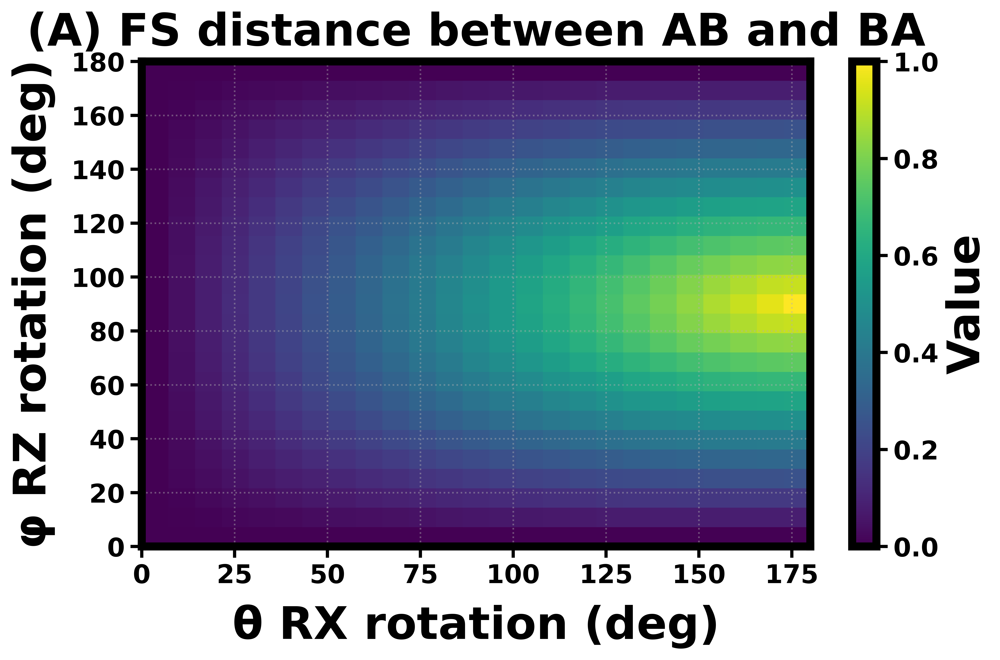

Saved: figs_single_metrics/HM_TV.png (DPI=360)
Saved: figs_single_metrics/HM_TV.pdf


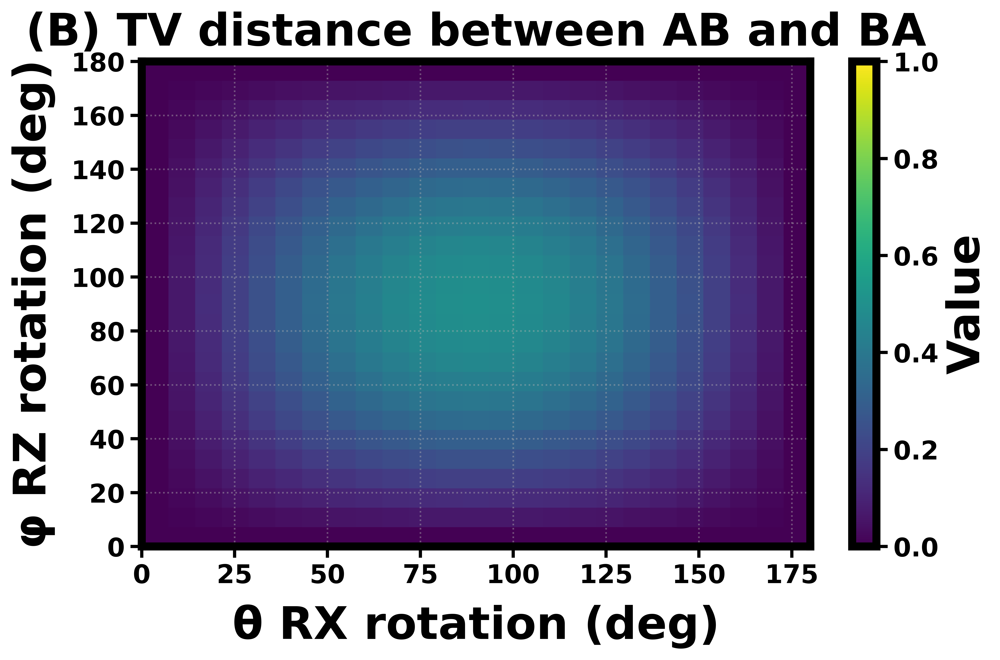

Saved: figs_single_metrics/HM_Classical_wrongrate.png (DPI=360)
Saved: figs_single_metrics/HM_Classical_wrongrate.pdf


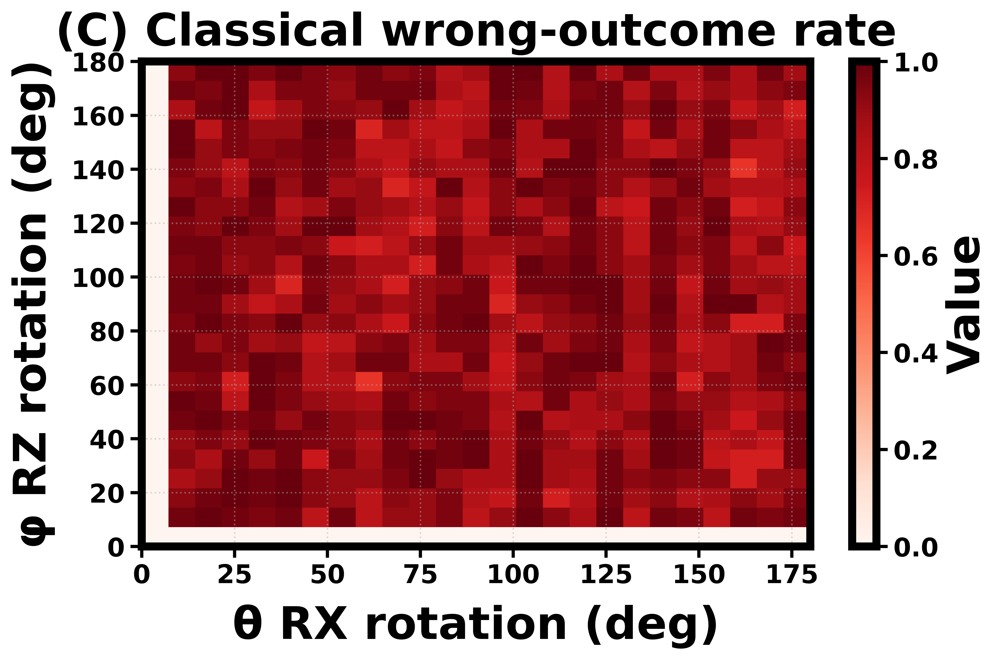

Saved: figs_single_metrics/AUC_separate.png (DPI=360)
Saved: figs_single_metrics/AUC_separate.pdf


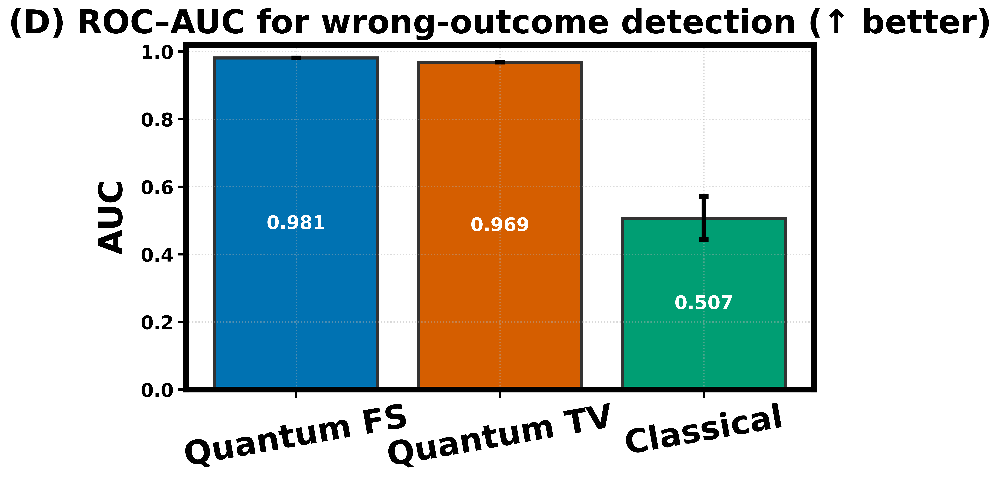

Saved: figs_single_metrics/AP_separate.png (DPI=360)
Saved: figs_single_metrics/AP_separate.pdf


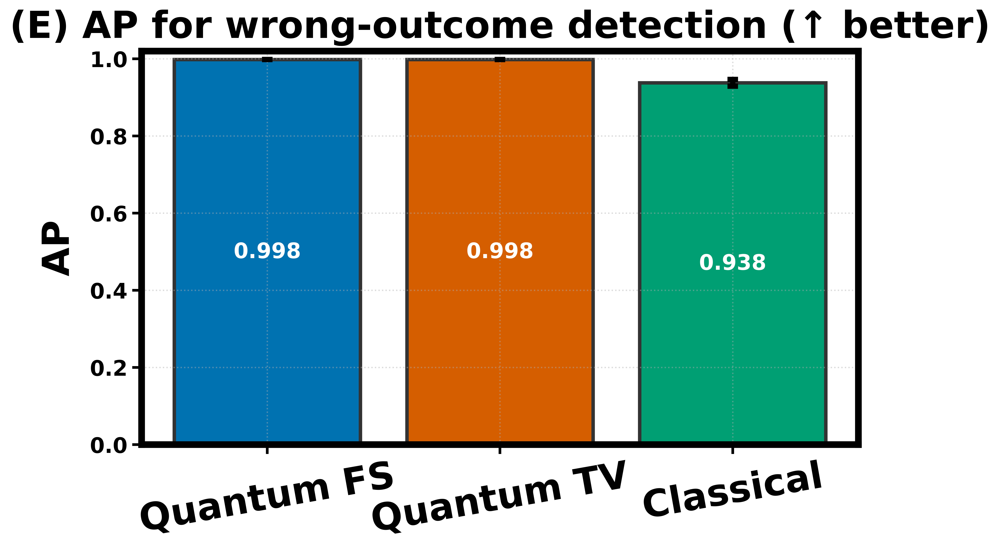


=== Repeated Metrics (7; error=ci95) ===
Method           | AUC (mean±err) | AP (mean±err) | BSS vs Classical (mean±err)
Quantum FS       | 0.981±0.000    | 0.998±0.000   | 0.300±0.005                
Quantum TV       | 0.969±0.000    | 0.998±0.000   | 0.156±0.006                
Classical Mixing | 0.507±0.064    | 0.938±0.009   | -                          

Saved CSV: cache/metrics_repeats.csv


In [ ]:
import os, json, math, time, csv, random, pickle, threading
from collections import Counter
from typing import Dict, List, Tuple

import numpy as np
import matplotlib as mpl
mpl.rcParams.update({
    # Crisp figures for both on-screen and file export (export DPI can be overridden in savefig)
    "figure.dpi": 800, "savefig.dpi": 800,
    # Readable grid & text defaults
    "axes.grid": True, "grid.linestyle": ":", "grid.alpha": 0.45,
    "axes.titlesize": 12, "axes.labelsize": 11,
    "legend.fontsize": 9, "xtick.labelsize": 10, "ytick.labelsize": 10,
    "axes.unicode_minus": False,

    "font.size": 16,          
    "axes.titlesize": 28,     
    "axes.labelsize": 28,     
    "xtick.labelsize": 16,    
    "ytick.labelsize": 16,
    "legend.fontsize": 16,

    "font.weight": "bold",
    "axes.titleweight": "bold",
    "axes.labelweight": "bold",

    "lines.linewidth": 10,   
    "lines.markersize": 20,
    "lines.markeredgewidth": 1.8,

    "axes.linewidth": 5,        
    "errorbar.capsize": 5,    

    "grid.linewidth": 1.0,
})

import matplotlib.pyplot as plt
import pennylane as qml

# ======================== Global configuration ========================
SEED = 7
np.random.seed(SEED)

# Grid and thread-interleaving controls for the classical (race) simulation
GRID_N, MUL_STEPS, ADD_STEPS = 25, 30, 30
TRIALS_LABEL, YIELD_EVERY, TOL = 40, 1, 1e-7

# Repeats & error bars
N_REPEATS, ERR_MODE = 7, "ci95"

# Optional single-point sampling (useful for quick sanity checks)
THETA0, PHI0, SHOTS = 0.8, 1.0, 5000

# Output & caching
SAVE_DIR = "figs_single_metrics"
FIG_DPI = 360               # PNG export DPI (PDF is vector; DPI affects embedded rasters)
SAVE_PNG, SAVE_PDF = True, True

CACHE_DIR = "cache"
CACHE_PICKLE = os.path.join(CACHE_DIR, "results_race.pkl")
CSV_OUT = os.path.join(CACHE_DIR, "metrics_repeats.csv")

os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(CACHE_DIR, exist_ok=True)

# Default colors for series (can be overridden via STYLE)
COLORS = {"FS": "#0072B2", "TV": "#D55E00", "CL": "#009E73"}

# ======================== I/O helper: save & show ========================
def save_and_show(fig, name):
    """
    Save a figure to PNG (high-DPI) and PDF (vector) and then show it inline.
    PDF uses DPI only for embedded rasters; lines/text remain vector graphics.
    """
    if SAVE_PNG:
        fig.savefig(os.path.join(SAVE_DIR, f"{name}.png"), dpi=FIG_DPI, bbox_inches="tight")
    if SAVE_PDF:
        fig.savefig(os.path.join(SAVE_DIR, f"{name}.svg"), bbox_inches="tight")
    print(f"Saved: {os.path.join(SAVE_DIR, name)}.png (DPI={FIG_DPI})")
    if SAVE_PDF:
        print(f"Saved: {os.path.join(SAVE_DIR, name)}.pdf")
    plt.show()
    plt.close(fig)

# ======================== Linear algebra & phase alignment ========================
def Rx(theta):
    """Single-qubit Rx(θ) rotation in the computational basis."""
    c, s = math.cos(theta/2), math.sin(theta/2)
    return np.array([[c, -1j*s], [-1j*s, c]], dtype=complex)

def Rz(phi):
    """Single-qubit Rz(φ) rotation in the computational basis."""
    return np.array([[np.exp(-1j*phi/2), 0],[0, np.exp(1j*phi/2)]], dtype=complex)

def align_phase_and_diff(A, B):
    """
    Frobenius distance between A and B after aligning global phase.
    This avoids penalizing a physically irrelevant global phase factor.
    """
    ip = np.vdot(A, B)
    if abs(ip) < 1e-16: return np.linalg.norm(A - B, 'fro')
    phase = np.exp(-1j * np.angle(ip))
    return np.linalg.norm(A - phase * B, 'fro')

def close_up_to_global_phase(A, B, tol=TOL):
    """Return True if A ≈ e^{iφ} B within tolerance tol."""
    return align_phase_and_diff(A, B) <= tol

# ======================== Classical concurrency simulation ========================
def classical_wrongrate_and_mixing(theta, phi,
                                   mul_steps=MUL_STEPS, add_steps=ADD_STEPS,
                                   trials=TRIALS_LABEL, yield_every=YIELD_EVERY, tol=TOL, seed=7):
    """
    Simulate interleaving of two non-commuting update loops:
      • Thread A applies Rx(θ) in mul_steps small steps.
      • Thread B applies Rz(φ) in add_steps small steps.
    A barrier aligns their start; each inner step may yield (time.sleep(0)) to encourage interleaving.

    For each trial we:
      1) Build S by interleaved A/B micro-updates.
      2) Compare against the exact AB and BA endpoints (Rx then Rz vs Rz then Rx), up to global phase.
         If S matches neither AB nor BA ⇒ count as a wrong outcome (race/interleaving error).
      3) Compute a simple mixing score in [0,1] = fraction of step-to-step switches (A→B or B→A).

    Returns:
      wrong_rate ∈ [0,1], wrong_bin ∈ {0,1} (≥1 wrong in trial-set), mean_mixing ∈ [0,1].
    """
    rng = random.Random(seed)
    A_step, B_step = Rx(theta/mul_steps), Rz(phi/add_steps)
    A_total, B_total = Rx(theta), Rz(phi)
    AB_endpoint = B_total @ A_total
    BA_endpoint = A_total @ B_total
    wrong = 0; mix_sum = 0.0

    for _ in range(trials):
        S = np.eye(2, dtype=complex); trace = []
        lock_trace = threading.Lock(); barrier = threading.Barrier(2)

        def A():
            nonlocal S
            barrier.wait()
            for i in range(mul_steps):
                S = A_step @ S
                with lock_trace: trace.append('A')
                if yield_every and (i % yield_every == 0): time.sleep(0)

        def B():
            nonlocal S
            barrier.wait()
            for i in range(add_steps):
                S = B_step @ S
                with lock_trace: trace.append('B')
                if yield_every and (i % yield_every == 0): time.sleep(0)

        t1 = threading.Thread(target=A); t2 = threading.Thread(target=B)
        t1.start(); t2.start(); t1.join(); t2.join()

        ok_AB = close_up_to_global_phase(S, AB_endpoint, tol=tol)
        ok_BA = close_up_to_global_phase(S, BA_endpoint, tol=tol)
        if not (ok_AB or ok_BA): wrong += 1

        if len(trace) <= 1:
            mix = 0.0
        else:
            switches = sum(1 for k in range(1, len(trace)) if trace[k] != trace[k-1])
            mix = switches / (len(trace) - 1)
        mix_sum += mix

    wrong_rate = wrong / trials
    return wrong_rate, int(wrong > 0), (mix_sum / trials)

def build_classical_grids(thetas, phis, seed):
    """
    Sweep θ×φ and compute:
      Yrate[j,i] = wrong-rate(θ_i, φ_j),
      Ybin [j,i] = 1 if any wrong outcome occurred within the trial-set, else 0,
      Cmix [j,i] = average mixing score.
    This is used both for heatmaps and as the classical score map for the bar metrics.
    """
    Yrate = np.zeros((len(phis), len(thetas))); Ybin = np.zeros_like(Yrate, dtype=int)
    Cmix  = np.zeros_like(Yrate)
    for i, th in enumerate(thetas):
        for j, ph in enumerate(phis):
            r, y, m = classical_wrongrate_and_mixing(th, ph, seed=seed + 7919*(i+1) + 97*(j+1))
            Yrate[j, i], Ybin[j, i], Cmix[j, i] = r, y, m
    return Yrate, Ybin, Cmix

# ======================== Quantum circuits & geometric distances ========================
# Separate 1-qubit devices for probability, state, and finite-shot counts
dev_probs  = qml.device("default.qubit", wires=1, shots=None)
dev_state  = qml.device("default.qubit", wires=1, shots=None)
dev_counts = qml.device("default.qubit", wires=1, shots=SHOTS)

@qml.qnode(dev_probs)
def circuit_AB_probs(theta, phi):
    """Prepare H → Rx(θ) → Rz(φ) and return exact probabilities over {|0>,|1>}."""
    qml.Hadamard(0); qml.RX(theta, 0); qml.RZ(phi, 0); return qml.probs(wires=0)

@qml.qnode(dev_probs)
def circuit_BA_probs(theta, phi):
    """Prepare H → Rz(φ) → Rx(θ) and return exact probabilities over {|0>,|1>}."""
    qml.Hadamard(0); qml.RZ(phi, 0); qml.RX(theta, 0); return qml.probs(wires=0)

@qml.qnode(dev_state)
def circuit_AB_state(theta, phi):
    """Return the full statevector for the AB order (used by Fubini–Study distance)."""
    qml.Hadamard(0); qml.RX(theta, 0); qml.RZ(phi, 0); return qml.state()

@qml.qnode(dev_state)
def circuit_BA_state(theta, phi):
    """Return the full statevector for the BA order (used by Fubini–Study distance)."""
    qml.Hadamard(0); qml.RZ(phi, 0); qml.RX(theta, 0); return qml.state()

@qml.qnode(dev_counts)
def circuit_AB_counts(theta, phi):
    """Finite-shot sampling for AB order (basis-state counts)."""
    qml.Hadamard(0); qml.RX(theta, 0); qml.RZ(phi, 0); return qml.counts(wires=0)

@qml.qnode(dev_counts)
def circuit_BA_counts(theta, phi):
    """Finite-shot sampling for BA order (basis-state counts)."""
    qml.Hadamard(0); qml.RZ(phi, 0); qml.RX(theta, 0); return qml.counts(wires=0)

def tv_distance(p, q):
    """Total variation distance = ½‖p − q‖₁."""
    return 0.5 * np.abs(np.asarray(p) - np.asarray(q)).sum()

def fs_distance(psi, phi):
    """Fubini–Study distance = arccos(|⟨ψ|φ⟩|)."""
    ov = np.vdot(psi, phi)
    return float(np.arccos(np.clip(np.abs(ov), 0.0, 1.0)))

def build_quantum_scores(thetas, phis):
    """
    Build two θ×φ grids:
      • TV[j,i] = TV distance between AB and BA probabilities.
      • FS[j,i] = Fubini–Study distance between AB and BA statevectors.
    """
    TV = np.zeros((len(phis), len(thetas))); FS = np.zeros_like(TV)
    for i, th in enumerate(thetas):
        for j, ph in enumerate(phis):
            P = circuit_AB_probs(th, ph); Q = circuit_BA_probs(th, ph)
            TV[j, i] = tv_distance(P, Q)
            sAB = circuit_AB_state(th, ph); sBA = circuit_BA_state(th, ph)
            FS[j, i] = fs_distance(sAB, sBA)
    return TV, FS

# ======================== Scalar metrics (bars) ========================
def auc_by_rank(scores, labels):
    """
    ROC–AUC via rank-sum / Mann–Whitney U equivalence.
    We use continuous scores and binary labels (1=wrong outcome present). :contentReference[oaicite:6]{index=6}
    """
    s = np.asarray(scores, float); y = np.asarray(labels, int)
    P = int((y == 1).sum()); N = len(y) - P
    if P == 0 or N == 0: return float("nan")
    order = np.argsort(s)
    ranks = np.empty_like(order, dtype=float); ranks[order] = np.arange(len(s), dtype=float) + 1.0
    pos_ranks = ranks[y == 1]
    return float((pos_ranks.sum() - P*(P+1)/2.0) / (P*N))

def precision_recall_ap(scores, labels):
    """
    Average Precision (area under precision–recall curve via monotone precision envelope). :contentReference[oaicite:7]{index=7}
    """
    order = np.argsort(-np.asarray(scores))
    s = np.asarray(scores)[order]; y = np.asarray(labels)[order]
    P = int((y == 1).sum())
    if P == 0: return float("nan")
    tps = np.cumsum(y == 1); fps = np.cumsum(y == 0)
    precision = tps / np.maximum(1, tps + fps); recall = tps / P
    p = precision.copy()
    for i in range(len(p)-2, -1, -1): p[i] = max(p[i], p[i+1])
    r_ext = np.r_[0.0, recall, 1.0]; p_ext = np.r_[p[0], p, p[-1]]
    return float(np.sum((r_ext[1:] - r_ext[:-1]) * p_ext[1:]))

def brier_score(y_true, p_pred):
    """Brier score = mean squared error between predicted probability and outcome. :contentReference[oaicite:8]{index=8}"""
    y_true = np.asarray(y_true, float); p_pred = np.asarray(p_pred, float)
    return float(np.mean((p_pred - y_true)**2))

def logloss(y_true, p_pred, eps=1e-12):
    """Log-loss / cross-entropy with epsilon clipping at [eps, 1-eps]. :contentReference[oaicite:9]{index=9}"""
    y_true = np.asarray(y_true, float); p = np.clip(np.asarray(p_pred, float), eps, 1-eps)
    return float(np.mean(-(y_true*np.log(p) + (1-y_true)*np.log(1-p))))

def skill_vs_classical(bs_q, bs_classical):
    """Brier Skill Score = 1 − (Brier_q / Brier_classical). Higher is better."""
    return 1.0 - (bs_q / max(1e-12, bs_classical))

def err_bar(vals, mode="ci95"):
    """Return (mean, error) with sample std or approximate 95% CI."""
    vals = np.asarray(vals, float); m = float(vals.mean())
    if len(vals) == 1: return m, 0.0
    sd = float(vals.std(ddof=1))
    if mode == "std": return m, sd
    sem = sd / math.sqrt(len(vals)); return m, 1.96 * sem

# ======================== Single experiment (one seed) ========================
def run_single_experiment(seed, capture_heatmaps=False):
    """
    Run one full θ×φ sweep for the given seed.
    Optionally capture one set of heatmaps (to avoid storing huge duplicates across repeats).
    Returns:
      out: scalar metrics (AUC/AP/Brier/Log-loss and skills),
      heatmaps (or None): dict of θ/φ grids for FS/TV and classical wrong/mix.
    """
    np.random.seed(seed)

    # Optional: single finite-shot print for debugging (left commented to keep the loop clean)
    # cAB = circuit_AB_counts(THETA0, PHI0); cBA = circuit_BA_counts(THETA0, PHI0)
    # pAB = np.array([cAB.get("0",0), cAB.get("1",0)]) / SHOTS
    # pBA = np.array([cBA.get("0",0), cBA.get("1",0)]) / SHOTS
    # print(f"[Single point] TV={tv_distance(pAB,pBA):.3f}  AB={dict(cAB)} BA={dict(cBA)}")

    thetas = np.linspace(0, np.pi, GRID_N); phis = np.linspace(0, np.pi, GRID_N)
    TV, FS = build_quantum_scores(thetas, phis); FS_n = FS / (0.5*np.pi)
    Yrate, Ybin, Cmix = build_classical_grids(thetas, phis, seed=seed+12345)

    # Flatten to 1D for scalar metrics with binary labels (wrong present vs not)
    labels = Ybin.ravel()
    s_tv, s_fs, s_cl = TV.ravel(), FS_n.ravel(), Cmix.ravel()

    # Rank-based & probability-scoring metrics
    auc_tv, auc_fs, auc_cl = auc_by_rank(s_tv, labels), auc_by_rank(s_fs, labels), auc_by_rank(s_cl, labels)
    ap_tv,  ap_fs,  ap_cl  = precision_recall_ap(s_tv, labels), precision_recall_ap(s_fs, labels), precision_recall_ap(s_cl, labels)
    bs_tv, bs_fs, bs_cl = brier_score(labels, s_tv), brier_score(labels, s_fs), brier_score(labels, s_cl)
    ll_tv, ll_fs, ll_cl = logloss(labels, s_tv),      logloss(labels, s_fs),      logloss(labels, s_cl)
    bss_tv_vs_cl = skill_vs_classical(bs_tv, bs_cl); bss_fs_vs_cl = skill_vs_classical(bs_fs, bs_cl)
    llss_tv_vs_cl = 1.0 - (ll_tv / max(1e-12, ll_cl)); llss_fs_vs_cl = 1.0 - (ll_fs / max(1e-12, ll_cl))

    out = {
        'AUC': {'TV': auc_tv, 'FS': auc_fs, 'Classical': auc_cl},
        'AP' : {'TV': ap_tv,  'FS': ap_fs,  'Classical': ap_cl},
        'BS' : {'TV': bs_tv,  'FS': bs_fs,  'Classical': bs_cl},
        'LL' : {'TV': ll_tv,  'FS': ll_fs,  'Classical': ll_cl},
        'BSS_vs_Classical': {'TV': bss_tv_vs_cl, 'FS': bss_fs_vs_cl},
        'LLSS_vs_Classical': {'TV': llss_tv_vs_cl, 'FS': llss_fs_vs_cl},
    }

    heatmaps = None
    if capture_heatmaps:
        heatmaps = {
            "thetas": thetas, "phis": phis,
            "TV": TV, "FS_n": FS_n, "WrongRate": Yrate, "Mixing": Cmix
        }
    return out, heatmaps

# ======================== Compute step: repeats + cache ========================
def compute_and_cache():
    """
    Run N_REPEATS independent experiments, gather lists for each metric family,
    and cache one set of heatmaps. The cache stores raw arrays (not only means)
    so plotting can recompute mean±error without re-running simulations.
    """
    all_metrics = {'AUC': {'TV':[], 'FS':[], 'Classical':[]},
                   'AP' : {'TV':[], 'FS':[], 'Classical':[]},
                   'BS' : {'TV':[], 'FS':[], 'Classical':[]},
                   'BSS_vs_Classical': {'TV':[], 'FS':[]},
                   'LL': {'TV':[], 'FS':[], 'Classical':[]},
                   'LLSS_vs_Classical': {'TV':[], 'FS':[]}}
    heatmaps_first = None

    for r in range(N_REPEATS):
        seed = SEED + 1000*r
        print(f"[Run {r+1}/{N_REPEATS}] seed={seed}")
        res, hmap = run_single_experiment(seed, capture_heatmaps=(heatmaps_first is None))
        if heatmaps_first is None: heatmaps_first = {"seed": seed, **hmap}

        # Append results per family; keep raw per-repeat values
        for k in ['AUC','AP','BS','LL']:
            for m in ['TV','FS','Classical']:
                all_metrics[k][m].append(res[k][m])
        for k2 in ['BSS_vs_Classical','LLSS_vs_Classical']:
            for m in ['TV','FS']:
                all_metrics[k2][m].append(res[k2][m])

    payload = {
        "meta": {
            "grid_n": GRID_N, "mul_steps": MUL_STEPS, "add_steps": ADD_STEPS,
            "trials": TRIALS_LABEL, "yield_every": YIELD_EVERY, "tol": TOL,
            "repeats": N_REPEATS, "seed0": SEED, "err_mode": ERR_MODE,
            "timestamp": time.strftime("%Y-%m-%d %H:%M:%S"),
        },
        "metrics": all_metrics,
        "heatmap": heatmaps_first,
    }
    with open(CACHE_PICKLE, "wb") as f:
        pickle.dump(payload, f)
    print(f"Saved raw results: {CACHE_PICKLE}")

    # Write a quick summary CSV now (plot step also writes CSV for plot-only users)
    write_csv_from_payload(payload, CSV_OUT)

# ======================== CSV writer ========================
def mean_err_list(vals):
    """Convenience wrapper that returns (mean, error) using the chosen ERR_MODE."""
    m, e = err_bar(vals, mode=ERR_MODE); return m, e

def write_csv_from_payload(payload, csv_path):
    """
    Summarize the repeated metrics into a compact CSV with mean±err for each family
    (AUC/AP/BSS) and each method (Quantum FS, Quantum TV, Classical).
    """
    M = payload["metrics"]
    auc_tv_m, auc_tv_e = mean_err_list(M['AUC']['TV'])
    auc_fs_m, auc_fs_e = mean_err_list(M['AUC']['FS'])
    auc_cl_m, auc_cl_e = mean_err_list(M['AUC']['Classical'])
    ap_tv_m, ap_tv_e   = mean_err_list(M['AP']['TV'])
    ap_fs_m, ap_fs_e   = mean_err_list(M['AP']['FS'])
    ap_cl_m, ap_cl_e   = mean_err_list(M['AP']['Classical'])
    bss_tv_m, bss_tv_e = mean_err_list(M['BSS_vs_Classical']['TV'])
    bss_fs_m, bss_fs_e = mean_err_list(M['BSS_vs_Classical']['FS'])

    rows = [
        ["Method", "AUC (mean±err)", "AP (mean±err)", "BSS vs Classical (mean±err)"],
        ["Quantum FS", f"{auc_fs_m:.3f}±{auc_fs_e:.3f}", f"{ap_fs_m:.3f}±{ap_fs_e:.3f}", f"{bss_fs_m:.3f}±{bss_fs_e:.3f}"],
        ["Quantum TV", f"{auc_tv_m:.3f}±{auc_tv_e:.3f}", f"{ap_tv_m:.3f}±{ap_tv_e:.3f}", f"{bss_tv_m:.3f}±{bss_tv_e:.3f}"],
        ["Classical Mixing", f"{auc_cl_m:.3f}±{auc_cl_e:.3f}", f"{ap_cl_m:.3f}±{ap_cl_e:.3f}", "-"],
    ]
    print("\n=== Repeated Metrics ({}; error={}) ===".format(N_REPEATS, ERR_MODE))
    w = [max(len(r[i]) for r in rows) for i in range(len(rows[0]))]
    for r in rows: print(" | ".join(s.ljust(w[i]) for i,s in enumerate(r)))

    with open(csv_path, "w", newline="", encoding="utf-8") as f:
        csv.writer(f).writerows(rows)
    print(f"\nSaved CSV: {csv_path}")

# ======================== Plotting styles & helpers ========================
DEFAULT_STYLE = {
    # Heatmap titles
    "titles": {
        "HM_FS": "(A) FS distance between AB and BA",
        "HM_TV": "(B) TV distance between AB and BA",
        "HM_WR": "(C) Classical wrong-outcome rate",
        # "HM_MX": "(D) Classical interleaving: thread-switching rate (mixing)",
        "BAR_AUC": "(D) ROC–AUC for wrong-outcome detection (↑ better)",
        "BAR_AP":  "(E) AP for wrong-outcome detection (↑ better)",
        # "BAR_BSS": "(G) Brier Skill Score vs classical",
    },
    "labels": {
        "theta": "θ RX rotation (deg)",
        "phi":   "φ RZ rotation (deg)",
        "auc":   "AUC", "ap": "AP", "bss": "BSS"
    },
    "colormaps": {
        "FS": "viridis",
        "TV": "viridis",
        "WR": "Reds",
        "MX": "Reds",
    },
    "bar": {
        # draw order for each bar group
        "order_auc": ["FS", "TV", "CL"],
        "order_ap":  ["FS", "TV", "CL"],
        "order_bss": ["FS", "TV"],
        "colors": {"FS": COLORS["FS"], "TV": COLORS["TV"], "CL": COLORS["CL"]},

        "linewidth": 2.6,         
        "capsize": 4,            
        "err_elinewidth": 4,     
        "err_capthick": 4,       
        "xtick_fontsize": 28,    

        "edgecolor": "#333333",
        "ylim_auc": (0, 1.02),
        "ylim_ap":  (0, 1.02),
        },
    # Optional overall subtitle shown above bar charts
    "subtitle": None
}

def deep_merge(a: dict, b: dict):
    """Recursively merge dict b into a (used to override DEFAULT_STYLE with STYLE or JSON)."""
    for k, v in b.items():
        if isinstance(v, dict) and isinstance(a.get(k), dict):
            deep_merge(a[k], v)
        else:
            a[k] = v

def load_style(style: dict = None, style_json_path: str = None) -> dict:
    """Load style dictionary, optionally merging an external style.json into DEFAULT_STYLE."""
    import copy
    style_out = copy.deepcopy(DEFAULT_STYLE)
    if style is not None: deep_merge(style_out, style)
    if style_json_path and os.path.isfile(style_json_path):
        with open(style_json_path, "r", encoding="utf-8") as f:
            user = json.load(f)
        deep_merge(style_out, user)
    return style_out

def draw_heatmap(data, title, fname, xlabel, ylabel, cmap="viridis", vmin=None, vmax=None, extent=(0,180,0,180)):
    """Generic single-heatmap helper with colorbar, tight layout, and PNG/PDF export."""
    fig = plt.figure(figsize=(9, 6))
    ax = fig.add_subplot(111)
    im = ax.imshow(data, origin='lower', extent=extent, aspect='auto', vmin=vmin, vmax=vmax, cmap=cmap)
    ax.set_title(title, pad=10); ax.set_xlabel(xlabel, labelpad=10); ax.set_ylabel(ylabel, labelpad=10)
    cb = fig.colorbar(im, ax=ax); cb.ax.set_ylabel('Value')
    plt.tight_layout()
    save_and_show(fig, fname)

def draw_bar(labels, means, errs, colors, title, ylabel, fname, ylim=None, subtitle=None):
    """Generic bar-plot helper with error bars and optional numeric labels on top."""
    fig = plt.figure(figsize=(9, 6))
    ax = fig.add_subplot(111)
    x = np.arange(len(labels))
    bars = ax.bar(x, means, yerr=errs, capsize=DEFAULT_STYLE["bar"]["capsize"],
                  color=colors, edgecolor=DEFAULT_STYLE["bar"]["edgecolor"],
                  linewidth=DEFAULT_STYLE["bar"]["linewidth"], 
                  error_kw=dict(                             
                    elinewidth=DEFAULT_STYLE["bar"]["err_elinewidth"],
                    capsize=DEFAULT_STYLE["bar"]["capsize"],
                    capthick=DEFAULT_STYLE["bar"]["err_capthick"]
                ))
    ax.set_ylim(0, 1.0)
    try:
        ax.bar_label(
            bars, fmt="%.3f",
            label_type='center',    
            padding=0,
            color='white', weight='bold'
        )
    except Exception:
        for rect, val, err in zip(bars, means, errs):
            ax.text(rect.get_x()+rect.get_width()/2, val + (max(errs) if len(errs)>0 else 0.01)*0.05,
                    f"{val:.3f}", ha="center", va="bottom", fontsize=9)
    ax.set_xticks(x); ax.set_xticklabels(labels, rotation=10, fontsize=DEFAULT_STYLE["bar"]["xtick_fontsize"])
    if ylim is not None: ax.set_ylim(*ylim)
    ax.set_ylabel(ylabel, labelpad=10)
    ax.set_title(title, pad=10)
    ax.grid(axis='y', linestyle=':', alpha=0.45)
    if subtitle:
        fig.suptitle(subtitle, y=0.99, fontsize=28)
    plt.tight_layout()
    save_and_show(fig, fname)

# ======================== Plotting from cache (no recompute) ========================
def plot_from_cache(style: dict = None, style_json_path: str = None, draw_heatmaps=True, draw_bars=True):
    """
    Read the cached payload, then:
      • draw 4 heatmaps (FS/TV and classical wrong/mix) if available,
      • draw 3 bar charts (AUC/AP/BSS) with mean±error,
      • write a fresh CSV summary as a convenience (also for plot-only runs).
    """
    with open(CACHE_PICKLE, "rb") as f:
        payload = pickle.load(f)

    STYLE = load_style(style, style_json_path)

    # ----- Heatmaps (first run’s snapshot only) -----
    if draw_heatmaps and payload.get("heatmap") is not None:
        H = payload["heatmap"]
        thetas, phis = H["thetas"], H["phis"]
        extent = (0, 180, 0, 180)
        draw_heatmap(H["FS_n"], STYLE["titles"]["HM_FS"], "HM_FS_normalized",
                     STYLE["labels"]["theta"], STYLE["labels"]["phi"],
                     cmap=STYLE["colormaps"]["FS"], vmin=0.0, vmax=1.0, extent=extent)
        draw_heatmap(H["TV"],   STYLE["titles"]["HM_TV"], "HM_TV",
                     STYLE["labels"]["theta"], STYLE["labels"]["phi"],
                     cmap=STYLE["colormaps"]["TV"], vmin=0.0, vmax=1.0, extent=extent)
        draw_heatmap(H["WrongRate"], STYLE["titles"]["HM_WR"], "HM_Classical_wrongrate",
                     STYLE["labels"]["theta"], STYLE["labels"]["phi"],
                     cmap=STYLE["colormaps"]["WR"], vmin=0.0, vmax=1.0, extent=extent)

    # ----- Bars (mean ± error) -----
    if draw_bars:
        M = payload["metrics"]
        subtitle = STYLE.get("subtitle", f"Metrics over {N_REPEATS} repeats (grid={GRID_N}×{GRID_N}, trials={TRIALS_LABEL})")

        # ROC–AUC
        auc_vals = {"FS": M["AUC"]["FS"], "TV": M["AUC"]["TV"], "CL": M["AUC"]["Classical"]}
        labels = []; means = []; errs = []; cols = []
        for key in STYLE["bar"]["order_auc"]:
            m,e = mean_err_list(auc_vals[key])
            labels.append({"FS":"Quantum FS","TV":"Quantum TV","CL":"Classical"}[key])
            means.append(m); errs.append(e); cols.append(STYLE["bar"]["colors"][key])
        draw_bar(labels, means, errs, cols,
                 STYLE["titles"]["BAR_AUC"], STYLE["labels"]["auc"], "AUC_separate",
                 ylim=STYLE["bar"]["ylim_auc"], subtitle=subtitle)

        # Average Precision
        ap_vals = {"FS": M["AP"]["FS"], "TV": M["AP"]["TV"], "CL": M["AP"]["Classical"]}
        labels = []; means = []; errs = []; cols = []
        for key in STYLE["bar"]["order_ap"]:
            m,e = mean_err_list(ap_vals[key])
            labels.append({"FS":"Quantum FS","TV":"Quantum TV","CL":"Classical"}[key])
            means.append(m); errs.append(e); cols.append(STYLE["bar"]["colors"][key])
        draw_bar(labels, means, errs, cols,
                 STYLE["titles"]["BAR_AP"], STYLE["labels"]["ap"], "AP_separate",
                 ylim=STYLE["bar"]["ylim_ap"], subtitle=subtitle)

    # Always write/update the summary CSV for convenience in plot-only mode
    write_csv_from_payload(payload, CSV_OUT)

# ======================== User switches & style overrides ========================
RUN_COMPUTE = False   # True once to generate the cache; leave False to plot-only
RUN_PLOT    = True    # True to draw figures from the cache

STYLE = {
    # Example: override bar colors or order
    # "bar": {
    #   "colors": {"FS":"#3366CC","TV":"#CC3333","CL":"#55AA55"},
    #   "order_auc": ["FS","TV","CL"],
    #   "order_ap":  ["FS","TV","CL"],
    #   "order_bss": ["FS","TV"]
    # },
    # "titles": {"BAR_AUC":"(E) ROC–AUC", "BAR_AP":"(F) Average Precision", "BAR_BSS":"(G) Brier Skill Score"},
    # "subtitle": "Your custom subtitle"
}
STYLE_JSON_PATH = None  # Optionally point to an external JSON, e.g., "style_race.json"

# ======================== Execute ========================
if RUN_COMPUTE:
    compute_and_cache()

if RUN_PLOT:
    if not os.path.isfile(CACHE_PICKLE):
        raise FileNotFoundError(f"Cache not found: {CACHE_PICKLE}. Set RUN_COMPUTE=True once to generate it.")
    plot_from_cache(STYLE, STYLE_JSON_PATH, draw_heatmaps=True, draw_bars=True)

Deadlock

In [7]:
import threading, time

lock1, lock2 = threading.Lock(), threading.Lock()
deadlocks = 0

def worker(order):
    global deadlocks
    try:
        first, second = (lock1, lock2) if order == 1 else (lock2, lock1)
        with first:
            time.sleep(0.001)
            with second:
                pass
    except Exception:
        deadlocks += 1

threads = [threading.Thread(target=worker, args=(1,)),
           threading.Thread(target=worker, args=(2,))]
[t.start() for t in threads]
[t.join(timeout=0.1) for t in threads]
if any(t.is_alive() for t in threads):
    deadlocks += 1
print("Deadlocks:", deadlocks)


Deadlocks: 1


Saved: figs_deadlock_single/A_deadlock_vs_jitter.png (DPI=360)
Saved: figs_deadlock_single/A_deadlock_vs_jitter.pdf


Saved: figs_deadlock_single/C_total_runtime.png (DPI=360)
Saved: figs_deadlock_single/C_total_runtime.pdf


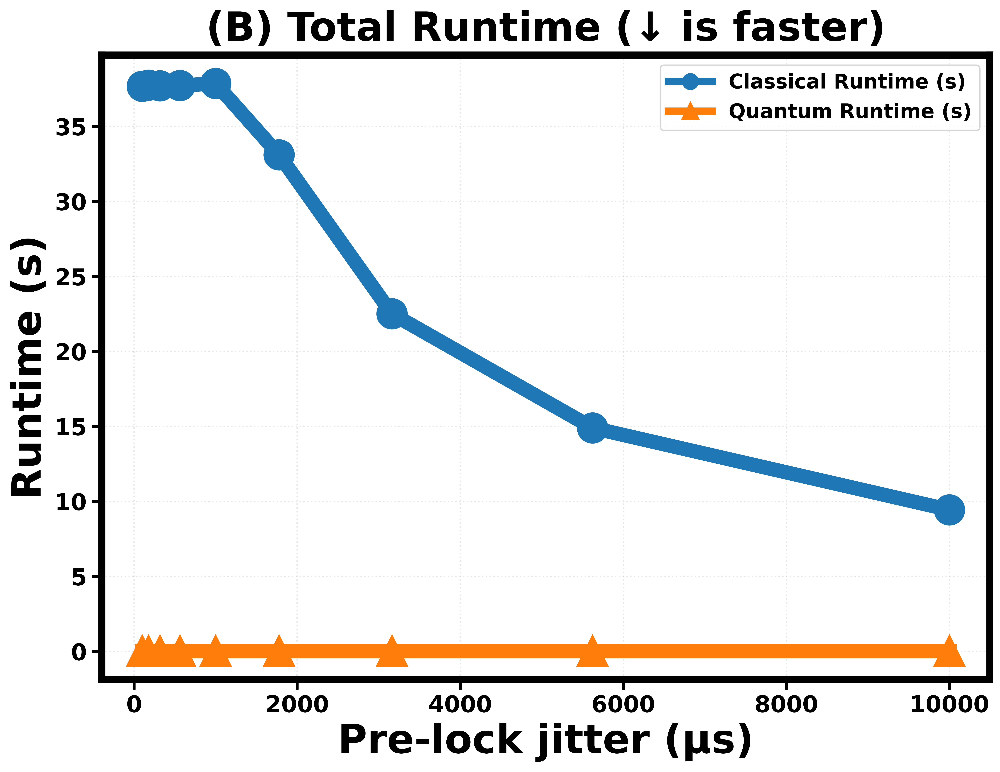

Saved: figs_deadlock_single/D_risk_reduction.png (DPI=360)
Saved: figs_deadlock_single/D_risk_reduction.pdf


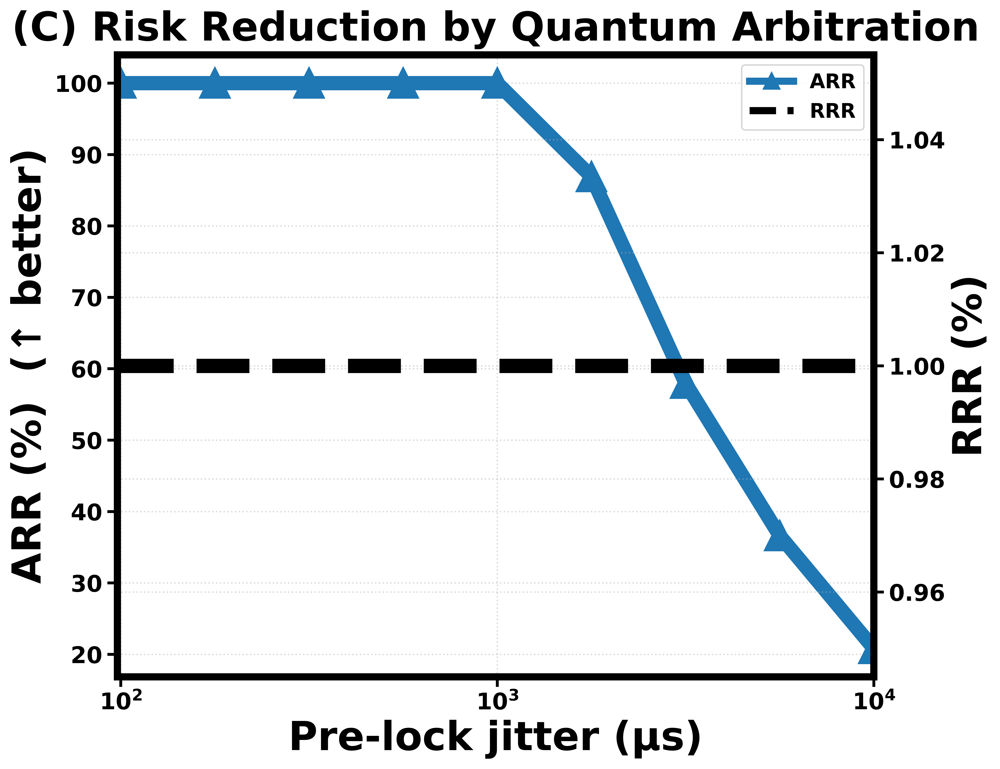


=== Deadlock vs JITTER (means ± ci95 over 7 repeats) ===
Quantum (W-state): double-grant% = 0.000±0.000, Jain = 0.999±0.000, runtime = 0.018±0.011s
JITTER_us | Classical_Deadlock%_mean | Classical_Deadlock%_err | Progress%_mean | Progress%_err | ARR%_mean | ARR%_err | Quantum_DoubleGrant%_mean | Quantum_Jain_mean | Classical_Runtime_s_total_mean | Quantum_Runtime_s_mean | ProgTime_p50_ms | ProgTime_p90_ms | ProgTime_p99_ms | WaitTime_p50_ms | WaitTime_p90_ms | WaitTime_p99_ms | Quantum_round_cost_ms
100.0     | 100.000                  | 0.000                   | 0.000          | 0.000         | 100.000   | 0.000    | 0.000                     | 0.999             | 268.691                        | 0.018                  | 120.00          | 120.00          | 120.00          | 0.00            | 0.00            | 0.00            | 0.004                
177.8     | 100.000                  | 0.000                   | 0.000          | 0.000         | 100.000   | 0.000    | 0.000           

In [8]:
import os, json, math, time, csv, random, pickle, threading
from collections import Counter
from typing import Dict, List, Tuple

import numpy as np
import matplotlib as mpl
mpl.rcParams.update({
    "figure.dpi": 800, "savefig.dpi": 800,
    "axes.grid": True, "grid.linestyle": ":", "grid.alpha": 0.45,
    "font.size": 16,
    "axes.titlesize": 28, "axes.labelsize": 28,
    "xtick.labelsize": 16, "ytick.labelsize": 16, "legend.fontsize": 16,
    "font.weight": "bold", "axes.titleweight": "bold", "axes.labelweight": "bold",
    "lines.linewidth": 10, "lines.markersize": 20, "lines.markeredgewidth": 1.8,
    "axes.linewidth": 5,
    "xtick.major.width": 2.0, "ytick.major.width": 2.0,
    "xtick.major.size": 7, "ytick.major.size": 7,
    "errorbar.capsize": 5,
    "grid.linewidth": 1.0,
    "axes.unicode_minus": False,
})

import matplotlib.pyplot as plt
import pennylane as qml

# =============== Experiment config (kept identical to the original) ===============
THREADS = 4
CLASSICAL_TRIALS = 300
JITTER_GRID = np.logspace(-4, -2, 9)   # seconds: 1e-4 … 1e-2
HOLD_AFTER_1ST = 0.001
JOIN_TIMEOUT   = 0.12

ROUNDS    = 4000
N_REPEATS = 7
ERR_MODE  = "ci95"

SEED = 7
_rng = random.Random(SEED)
np.random.seed(SEED)

# =============== Output/cache config (new) ===============
SAVE_DIR  = "figs_deadlock_single"
FIG_DPI   = 360
SAVE_PNG, SAVE_PDF = True, True
CACHE_DIR = "cache"
CACHE_PICKLE = os.path.join(CACHE_DIR, "deadlock_results.pkl")
CSV_OUT   = "deadlock_quantum_vs_classical_metrics.csv"
os.makedirs(SAVE_DIR, exist_ok=True)
os.makedirs(CACHE_DIR, exist_ok=True)

# =============== Utilities (logic unchanged) ===============
def save_and_show(fig, name):
    """Save PNG and PDF then show the figure; close afterwards."""
    if SAVE_PNG:
        fig.savefig(os.path.join(SAVE_DIR, f"{name}.png"), dpi=FIG_DPI, bbox_inches="tight")
    if SAVE_PDF:
        fig.savefig(os.path.join(SAVE_DIR, f"{name}.svg"), bbox_inches="tight")
    print(f"Saved: {os.path.join(SAVE_DIR, name)}.png (DPI={FIG_DPI})")
    if SAVE_PDF:
        print(f"Saved: {os.path.join(SAVE_DIR, name)}.pdf")
    plt.show(); plt.close(fig)

def jain_index(d):
    """Jain’s fairness over a dict of counts."""
    xs = np.array(list(d.values()), dtype=float)
    den = len(xs) * (xs**2).sum()
    return (xs.sum()**2 / den) if den > 0 else 1.0

def mean_err(vals, mode=ERR_MODE):
    """Return mean and error (std or ~95% CI)."""
    vals = np.asarray(vals, float); m = float(vals.mean())
    if len(vals) == 1: return m, 0.0
    sd = float(vals.std(ddof=1))
    if mode == "std": return m, sd
    sem = sd / math.sqrt(len(vals)); return m, 1.96 * sem

def ecdf(data):
    """Empirical CDF (sorted x, cumulative fraction)."""
    x = np.sort(np.asarray(data, float))
    if len(x) == 0: return x, x
    y = np.arange(1, len(x)+1) / len(x)
    return x, y

def quantiles_ms(samples, qs=(50, 90, 99)):
    """Percentiles (ms) for an array of seconds."""
    if len(samples) == 0: return [0.0 for _ in qs]
    arr = np.asarray(samples, float) * 1e3
    return [float(np.percentile(arr, q)) for q in qs]

def load_pickle(path: str):
    """Load cached pickle (raw arrays + metadata)."""
    with open(path, "rb") as f:
        return pickle.load(f)

# =============== Classical (thread-based) — logic kept ===============
def one_deadlock_trial_with_availability(jitter, hold=HOLD_AFTER_1ST, timeout=JOIN_TIMEOUT,
                                         opposite_order=True, seed=None):
    """
    Two threads and two locks. A grabs L1→L2, B grabs L2→L1 (opposite order).
    Returns:
      (deadlocked, time_to_first_progress_s, wait_samples_s)
    where `wait_samples_s` collects per-acquire wait times for successful acquisitions.
    """
    rng = _rng if seed is None else random.Random(seed)
    lock1, lock2 = threading.Lock(), threading.Lock()
    barrier = threading.Barrier(3)
    done_event = threading.Event()
    wait_samples = []
    start_time = {'t': None}
    done_time  = {'t': None}
    wait_lock = threading.Lock()

    def push_wait(v):
        with wait_lock:
            wait_samples.append(v)

    def tA():
        barrier.wait()
        time.sleep(rng.uniform(0, jitter))
        t0 = time.perf_counter(); lock1.acquire()
        push_wait(time.perf_counter() - t0)
        try:
            time.sleep(hold)
            t1 = time.perf_counter(); lock2.acquire()
            push_wait(time.perf_counter() - t1)
            lock2.release(); lock1.release()
            if not done_event.is_set():
                done_time['t'] = time.perf_counter(); done_event.set()
        finally:
            pass

    def tB():
        barrier.wait()
        time.sleep(rng.uniform(0, jitter))
        first, second = (lock2, lock1) if opposite_order else (lock1, lock2)
        t0 = time.perf_counter(); first.acquire()
        push_wait(time.perf_counter() - t0)
        try:
            time.sleep(hold)
            t1 = time.perf_counter(); second.acquire()
            push_wait(time.perf_counter() - t1)
            second.release(); first.release()
            if not done_event.is_set():
                done_time['t'] = time.perf_counter(); done_event.set()
        finally:
            pass

    a = threading.Thread(target=tA, daemon=True)
    b = threading.Thread(target=tB, daemon=True)
    a.start(); b.start()

    barrier.wait()
    start_time['t'] = time.perf_counter()

    done_event.wait(timeout)
    if done_event.is_set():
        progress_time = done_time['t'] - start_time['t']
        a.join(0.001); b.join(0.001)
        return False, progress_time, wait_samples
    else:
        a.join(0.001); b.join(0.001)
        return True, timeout, wait_samples

def classical_scan_deadlock(jitter_grid, trials=CLASSICAL_TRIALS, seed=SEED):
    """
    Scan over jitter values:
      • count deadlocks (%),
      • record time to first progress (s) per trial,
      • accumulate per-acquire waits from successful acquisitions only.
    """
    rates, runtimes = [], []
    prog_lists = [[] for _ in jitter_grid]
    wait_lists = [[] for _ in jitter_grid]
    for j_idx, jit in enumerate(jitter_grid):
        dead = 0
        t0 = time.perf_counter()
        for t in range(trials):
            s = seed + 10007*(j_idx+1) + 97*(t+1)
            d, prog_s, waits = one_deadlock_trial_with_availability(jitter=jit, seed=s)
            if d: dead += 1
            prog_lists[j_idx].append(prog_s)
            # Store waits from successful acquires only (as in the original)
            wait_lists[j_idx].extend(waits)
        wall = time.perf_counter() - t0
        rates.append(100.0 * dead / trials)
        runtimes.append(wall)
    return np.array(rates), np.array(runtimes), prog_lists, wait_lists

# =============== Quantum (W-state) — logic kept ===============
def w_state_amplitudes(n):
    """Return amplitudes for |W_n>, normalized."""
    amps = np.zeros(2**n, dtype=float)
    for k in range(n): amps[1 << k] = 1.0 / math.sqrt(n)
    return amps

def quantum_w_grants(n=THREADS, rounds=ROUNDS, seed=SEED):
    """
    Prepare |W_n> via StatePrep and sample `rounds` shots.
    Ideally yields single grants (popcount==1) with fairness across winners.
    """
    dev = qml.device("default.qubit", wires=n, shots=rounds)
    amps = w_state_amplitudes(n)
    @qml.qnode(dev)
    def sampler():
        qml.StatePrep(amps, wires=list(range(n)))
        return qml.sample(wires=list(range(n)))    # raw basis-state samples (no observable)
    t0 = time.perf_counter()
    samples = sampler()
    wall = time.perf_counter() - t0

    wins = Counter({i: 0 for i in range(n)}); invalid = 0
    for row in np.asarray(samples):
        ones = np.where(row == 1)[0]
        if len(ones) == 1: wins[int(ones[0])] += 1
        else: invalid += 1
    return dict(
        double_grant_pct=100.0 * invalid / rounds,
        fairness_jain=jain_index(wins),
        wins_hist=dict(wins),
        runtime_s=wall
    )

# =============== Repeats + cache (new) ===============
def run_repeats(jitter_grid, n_repeats=N_REPEATS):
    """
    Run multiple repeats and retain raw arrays for:
      • classical deadlock rate & runtimes,
      • per-jitter progress-time and wait samples,
      • quantum double-grant%, fairness, and runtimes.
    """
    cls_rates_all = []   # shape: [repeat, len(jitter)]
    cls_runt_all  = []
    prog_samples  = [ [] for _ in jitter_grid ]
    wait_samples  = [ [] for _ in jitter_grid ]

    q_dg_all, q_jain_all, q_rt_all = [], [], []

    for r in range(n_repeats):
        seed_r = SEED + 1000*r
        np.random.seed(seed_r)
        print(f"[Repeat {r+1}/{n_repeats}] seed={seed_r}")
        rates, rts, prog_lists, wait_lists = classical_scan_deadlock(jitter_grid, trials=CLASSICAL_TRIALS, seed=seed_r)
        cls_rates_all.append(rates); cls_runt_all.append(rts)
        for j in range(len(jitter_grid)):
            prog_samples[j].extend(prog_lists[j])
            wait_samples[j].extend(wait_lists[j])

        q = quantum_w_grants(n=THREADS, rounds=ROUNDS, seed=seed_r)
        q_dg_all.append(q['double_grant_pct'])
        q_jain_all.append(q['fairness_jain'])
        q_rt_all.append(q['runtime_s'])

    return (np.array(cls_rates_all), np.array(cls_runt_all),
            prog_samples, wait_samples,
            np.array(q_dg_all), np.array(q_jain_all), np.array(q_rt_all))

def compute_and_cache():
    """Heavy step: run repeats, cache raw results, and emit a CSV summary."""
    (cls_rates_all, cls_runt_all, prog_samples, wait_samples,
     q_dg_all, q_jain_all, q_rt_all) = run_repeats(JITTER_GRID, N_REPEATS)

    payload = {
        "meta": {
            "threads": THREADS, "classical_trials": CLASSICAL_TRIALS,
            "jitter_grid": list(map(float, JITTER_GRID)),
            "hold_after_first": HOLD_AFTER_1ST, "join_timeout": JOIN_TIMEOUT,
            "rounds": ROUNDS, "repeats": N_REPEATS, "seed0": SEED,
            "err_mode": ERR_MODE, "timestamp": time.strftime("%Y-%m-%d %H:%M:%S"),
        },
        "classical": {
            "rates": cls_rates_all,
            "runtimes": cls_runt_all,
            "prog_samples": prog_samples,
            "wait_samples": wait_samples,
        },
        "quantum": {
            "double_grant_pct": q_dg_all,
            "fairness_jain":    q_jain_all,
            "runtime_s":        q_rt_all,
        }
    }
    with open(CACHE_PICKLE, "wb") as f:
        pickle.dump(payload, f)
    print(f"Saved raw results: {CACHE_PICKLE}")

    # Write the CSV now; the plot step writes again so plot-only mode also gets the table.
    write_csv_from_payload(payload, CSV_OUT)

# =============== CSV (logic unchanged) ===============
def mean_err_list(vals): m, e = mean_err(vals, mode=ERR_MODE); return m, e

def write_csv_from_payload(payload, csv_path):
    """Render a one-row-per-jitter table with classical/quantum summaries and availability percentiles."""
    J = np.array(payload["meta"]["jitter_grid"])
    cls_rates_all = np.asarray(payload["classical"]["rates"])
    cls_runt_all  = np.asarray(payload["classical"]["runtimes"])
    prog_samples  = payload["classical"]["prog_samples"]
    wait_samples  = payload["classical"]["wait_samples"]
    q_dg_all      = np.asarray(payload["quantum"]["double_grant_pct"])
    q_jain_all    = np.asarray(payload["quantum"]["fairness_jain"])
    q_rt_all      = np.asarray(payload["quantum"]["runtime_s"])

    cl_rate_mean = cls_rates_all.mean(axis=0)
    cl_rate_err  = np.array([mean_err(cls_rates_all[:,i])[1] for i in range(len(J))])
    cl_prog_mean = 100.0 - cl_rate_mean
    cl_prog_err  = cl_rate_err.copy()
    cl_rt_tot    = cls_runt_all.sum(axis=1)
    cl_rt_m, cl_rt_e = mean_err(cl_rt_tot)

    q_dg_m, q_dg_e     = mean_err(q_dg_all)
    q_jain_m, q_jain_e = mean_err(q_jain_all)
    q_rt_m, q_rt_e     = mean_err(q_rt_all)

    prog_p50, prog_p90, prog_p99 = [], [], []
    wait_p50, wait_p90, wait_p99 = [], [], []
    for j in range(len(J)):
        p50, p90, p99 = quantiles_ms(prog_samples[j]);  prog_p50 += [p50]; prog_p90 += [p90]; prog_p99 += [p99]
        w50, w90, w99 = quantiles_ms(wait_samples[j]);  wait_p50 += [w50]; wait_p90 += [w90]; wait_p99 += [w99]

    q_cost_per_round_ms = (q_rt_m / payload["meta"]["rounds"]) * 1e3

    header = ["JITTER_us", "Classical_Deadlock%_mean", "Classical_Deadlock%_err",
              "Progress%_mean", "Progress%_err", "ARR%_mean", "ARR%_err",
              "Quantum_DoubleGrant%_mean", "Quantum_Jain_mean",
              "Classical_Runtime_s_total_mean", "Quantum_Runtime_s_mean",
              "ProgTime_p50_ms", "ProgTime_p90_ms", "ProgTime_p99_ms",
              "WaitTime_p50_ms", "WaitTime_p90_ms", "WaitTime_p99_ms",
              "Quantum_round_cost_ms"]
    rows = [header]
    for i, j_us in enumerate(J*1e6):
        rows.append([f"{j_us:.1f}",
                     f"{cl_rate_mean[i]:.3f}", f"{cl_rate_err[i]:.3f}",
                     f"{cl_prog_mean[i]:.3f}", f"{cl_prog_err[i]:.3f}",
                     f"{cl_rate_mean[i]:.3f}", f"{cl_rate_err[i]:.3f}",
                     f"{q_dg_m:.3f}", f"{q_jain_m:.3f}",
                     f"{cl_rt_m:.3f}", f"{q_rt_m:.3f}",
                     f"{prog_p50[i]:.2f}", f"{prog_p90[i]:.2f}", f"{prog_p99[i]:.2f}",
                     f"{wait_p50[i]:.2f}", f"{wait_p90[i]:.2f}", f"{wait_p99[i]:.2f}",
                     f"{q_cost_per_round_ms:.3f}"])

    print("\n=== Deadlock vs JITTER (means ± {} over {} repeats) ===".format(payload["meta"]["err_mode"], payload["meta"]["repeats"]))
    print("Quantum (W-state): double-grant% = {:.3f}±{:.3f}, Jain = {:.3f}±{:.3f}, runtime = {:.3f}±{:.3f}s"
          .format(q_dg_m, q_dg_e, q_jain_m, q_jain_e, q_rt_m, q_rt_e))
    colw = [max(len(str(r[c])) for r in rows) for c in range(len(header))]
    print(" | ".join(header[i].ljust(colw[i]) for i in range(len(header))))
    for r in rows[1:]:
        print(" | ".join(str(r[i]).ljust(colw[i]) for i in range(len(header))))

    with open(csv_path, "w", newline="", encoding="utf-8") as f:
        csv.writer(f).writerows(rows)
    print(f"\nSaved CSV: {csv_path}")

# =============== Style system (new; affects plotting only) ===============
DEFAULT_STYLE = {
    # Titles
    "titles": {
        "A": "(A) Deadlock Probability vs Pre-lock Jitter (↓ is better)",
        "B": "(B) Progress without Deadlock vs Pre-lock Jitter (↑ is better)",
        "C": "(B) Total Runtime (↓ is faster)",
        "D": "(C) Risk Reduction by Quantum Arbitration",
        "E": "(E) Time-to-First-Progress ECDF (Classical), with Quantum Baseline",
        "F": "(F) Classical Lock-Wait Time Quantiles vs Pre-lock Jitter",
    },
    # Axis labels
    "labels": {
        "x_jitter": "Pre-lock jitter (μs)",
        "deadlock": "Deadlock probability (%)",
        "progress": "Progress without deadlock (%)",
        "runtime":  "Runtime (s)",
        "ecdf_x":   "Time to first progress (ms)",
        "ecdf_y":   "ECDF",
        "wait_y":   "Lock wait time (ms)",
    },
    "series": {
        "classical_deadlock": {"marker":"o", "linestyle":"-",  "color": None,
                            "label":"Classical deadlock%", "linewidth": 10,
                            "markersize": 20, "capsize": 6, "legend_lw": 5, "legend_markerscale": 0.55},
        "quantum_deadlock":   {"linestyle":"--", "color": None, "label":"Quantum deadlock% (=0)",
                            "linewidth": 10, "legend_lw": 5, "legend_markerscale": 0.55},
        "classical_progress": {"marker":"s", "linestyle":"-",  "color": None,
                            "label":"Classical progress%", "linewidth": 10,
                            "markersize": 20, "capsize": 6, "legend_lw": 5, "legend_markerscale": 0.55},
        "quantum_progress":   {"linestyle":"--", "color": None, "label":"Quantum progress% (=100)",
                            "linewidth": 10, "legend_lw": 5, "legend_markerscale": 0.55},
    },
    # Bars for the (C) runtime figure were replaced with line+markers earlier
    "bar": {
        "edgecolor":"#333333", "linewidth":0.6, "capsize":4,
        "colors":{"classical":"C0", "quantum":"C1"},
        "labels":["Classical (sum over trials)", "Quantum (W-state shots)"]
    },
    "ecdf": {
        "picks": [0, 5, 8]  # sample three jitter points: ~100 μs, ~1778 μs, ~10000 μs
    },
    "subtitles": {
        "top":  lambda repeats, trials: f"",
        # "top":  lambda repeats, trials: f"Deadlock: Classical two-lock vs Quantum W-state  (repeats={repeats}, trials/pt={trials})",
        "bottom":"Availability details: First-progress CDF & Lock-wait quantiles"
    }
}

def deep_merge(a: dict, b: dict):
    """Recursive dict merge (used to overlay user STYLE / style.json)."""
    for k, v in b.items():
        if isinstance(v, dict) and isinstance(a.get(k), dict):
            deep_merge(a[k], v)
        else:
            a[k] = v

def load_style(style: dict = None, style_json_path: str = None) -> dict:
    """Load plotting style; unspecified fields fall back to DEFAULT_STYLE."""
    import copy
    out = copy.deepcopy(DEFAULT_STYLE)
    if style is not None: deep_merge(out, style)
    if style_json_path and os.path.isfile(style_json_path):
        with open(style_json_path, "r", encoding="utf-8") as f:
            user = json.load(f)
        deep_merge(out, user)
    return out

# --- helper: set log scale and start at the first data point (~100 µs) ---
def _apply_log_x_with_left_bound(ax, xs, pad_ratio=0.02):
    """
    Use a log x-axis and set the left bound near the first jitter to avoid a large empty region.
    pad_ratio slightly shifts the left limit leftwards so the first marker isn't glued to the frame.
    """
    xmin, xmax = float(np.min(xs)), float(np.max(xs))
    left = xmin * (1.0 - pad_ratio)
    ax.set_xscale("log")
    ax.set_xlim(left=left, right=xmax)

# =============== Plot-only: render from cache (no re-computation) ===============
def plot_from_cache(style: dict = None, style_json_path: str = None):
    payload = load_pickle(CACHE_PICKLE)
    STYLE = load_style(style, style_json_path)

    J  = np.array(payload["meta"]["jitter_grid"])
    xs = J * 1e6  # convert to μs for plotting
    repeats = payload["meta"]["repeats"]
    trials  = payload["meta"]["classical_trials"]

    cls_rates_all = np.asarray(payload["classical"]["rates"])
    cls_runt_all  = np.asarray(payload["classical"]["runtimes"])
    prog_samples  = payload["classical"]["prog_samples"]
    wait_samples  = payload["classical"]["wait_samples"]
    q_rt_all      = np.asarray(payload["quantum"]["runtime_s"])

    # Classical summaries
    cl_rate_mean = cls_rates_all.mean(axis=0)
    cl_rate_err  = np.array([mean_err(cls_rates_all[:, i])[1] for i in range(len(J))])
    cl_prog_mean = 100.0 - cl_rate_mean
    cl_prog_err  = cl_rate_err.copy()

    # Runtimes
    cl_rt_tot = cls_runt_all.sum(axis=1)
    cl_rt_m, cl_rt_e = mean_err(cl_rt_tot)
    q_rt_m,  q_rt_e  = mean_err(q_rt_all)

    # Quantum ideal lines for A/B
    q_deadlock_line = np.zeros_like(cl_rate_mean)
    q_progress_line = 100.0 * np.ones_like(cl_rate_mean)

    # (A) Deadlock
    figA, axA = plt.subplots(figsize=(10, 8))
    _apply_log_x_with_left_bound(axA, xs)
    s = STYLE["series"]["classical_deadlock"]
    axA.plot(xs, cl_rate_mean,
                 marker=s.get("marker","o"),
                 linestyle=s.get("linestyle","-"), color=s.get("color",None),
                 label=s.get("label"))
    s2 = STYLE["series"]["quantum_deadlock"]
    axA.plot(xs, q_deadlock_line, s2.get("linestyle","--"), marker=s2.get("marker","^"),
             color=s2.get("color",None), label=s2.get("label"))
    axA.set_xlabel(STYLE["labels"]["x_jitter"]); axA.set_ylabel(STYLE["labels"]["deadlock"])
    axA.set_title(STYLE["titles"]["A"], pad=10)

    leg = axA.legend(markerscale=0.5,   
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)

    for ln in leg.get_lines():     
        ln.set_linewidth(5)

    figA.suptitle(STYLE["subtitles"]["top"](repeats, trials), y=0.99, fontsize=10)
    plt.tight_layout(); save_and_show(figA, "A_deadlock_vs_jitter")

    # # (B) Progress without deadlock
    # figB, axB = plt.subplots(figsize=(10, 8))
    # _apply_log_x_with_left_bound(axB, xs)
    # s = STYLE["series"]["classical_progress"]
    # axB.errorbar(xs, cl_prog_mean, yerr=cl_prog_err,
    #              marker=s.get("marker","s"), capsize=s.get("capsize",3),
    #              linestyle=s.get("linestyle","-"), color=s.get("color",None),
    #              label=s.get("label"))
    # s2 = STYLE["series"]["quantum_progress"]
    # axB.plot(xs, q_progress_line, s2.get("linestyle","--"),
    #          color=s2.get("color",None), label=s2.get("label"))
    # axB.set_xlabel(STYLE["labels"]["x_jitter"]); axB.set_ylabel(STYLE["labels"]["progress"])
    # axB.set_ylim(0, 105)
    # axB.set_title(STYLE["titles"]["B"])
    # axB.legend()
    # figB.suptitle(STYLE["subtitles"]["top"](repeats, trials), y=0.99, fontsize=10)
    # plt.tight_layout(); save_and_show(figB, "B_progress_without_deadlock")

    # (C) Total runtime (↓ is faster) — line + markers + error bars
    # Per-jitter mean±err across repeats
    cl_rt_m_by_j = cls_runt_all.mean(axis=0)
    cl_rt_e_by_j = np.array([mean_err(cls_runt_all[:, i])[1] for i in range(len(J))])
    # Quantum: draw as an (approximately) flat line with its own mean±err
    q_rt_m, q_rt_e = mean_err(q_rt_all)
    q_rt_m_line = np.full_like(xs, q_rt_m, dtype=float)
    q_rt_e_line = np.full_like(xs, q_rt_e, dtype=float)

    figC, axC = plt.subplots(figsize=(10, 8))
    axC.plot(xs, cl_rt_m_by_j,
                 marker='o', linestyle='-',
                 label='Classical Runtime (s)')
    axC.plot(xs, q_rt_m_line,
                 marker='^', linestyle='-',
                 label='Quantum Runtime (s)')
    axC.set_xlabel(STYLE["labels"]["x_jitter"])
    axC.set_ylabel(STYLE["labels"]["runtime"])
    axC.set_title(STYLE["titles"]["C"], pad=10)

    leg = axC.legend(markerscale=0.5,   
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)

    for ln in leg.get_lines():      
        ln.set_linewidth(5)

    axC.grid(True, alpha=0.3)
    figC.suptitle(STYLE["subtitles"]["top"](repeats, trials), y=0.99, fontsize=10)
    plt.tight_layout(); save_and_show(figC, "C_total_runtime")

    # (D) Risk reduction = classical% − quantum% (quantum deadlock% = 0)
    figD, axD = plt.subplots(figsize=(10, 8))
    axDy = axD.twinx()
    _apply_log_x_with_left_bound(axD, xs)
    _apply_log_x_with_left_bound(axDy, xs)
    arr_mean, arr_err = cl_rate_mean, cl_rate_err
    rrr_line = (cl_rate_mean > 0).astype(float)
    axD.plot(xs, arr_mean, marker='^',
                 label='ARR')
    axDy.plot(xs, rrr_line, 'k--', label='RRR')
    axD.set_xlabel(STYLE["labels"]["x_jitter"]); axD.set_ylabel('ARR (%)  (↑ better)')
    axDy.set_ylabel('RRR (%)')
    axD.set_title(STYLE["titles"]["D"], pad=10)
    lines1, labels1 = axD.get_legend_handles_labels(); lines2, labels2 = axDy.get_legend_handles_labels() 

    leg = axD.legend(lines1+lines2, labels1+labels2, loc='best', markerscale=0.5,   
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)
    
    for ln in leg.get_lines():      
        ln.set_linewidth(5)

    figD.suptitle(STYLE["subtitles"]["top"](repeats, trials), y=0.99, fontsize=10)
    plt.tight_layout(); save_and_show(figD, "D_risk_reduction")

    # # (E) Time-to-first-progress CDF (classical), with a vertical quantum baseline
    # picks = STYLE["ecdf"]["picks"]
    # labels_j = [f"{J[i]*1e6:.0f} μs" for i in picks]
    # figE, axE = plt.subplots(figsize=(9, 6))
    # for i, ci in enumerate(picks):
    #     x, y = ecdf(prog_samples[ci])   # seconds → ms inside the plot call
    #     axE.step(x*1e3, y, where='post', label=f'Classical CDF @ {labels_j[i]}')
    # q_cost_per_round_ms = (mean_err(np.asarray(payload["quantum"]["runtime_s"]))[0] / payload["meta"]["rounds"]) * 1e3
    # axE.axvline(q_cost_per_round_ms, color='k', linestyle='--', linewidth=1.5,
    #             label=f'Quantum per-round cost ≈ {q_cost_per_round_ms:.3f} ms')
    # axE.set_xlabel(STYLE["labels"]["ecdf_x"]); axE.set_ylabel(STYLE["labels"]["ecdf_y"])
    # axE.set_xlim(left=0)
    # axE.set_title(STYLE["titles"]["E"])
    # axE.legend()
    # figE.suptitle(STYLE["subtitles"]["bottom"], y=0.99, fontsize=10)
    # plt.tight_layout(); save_and_show(figE, "E_cdf_first_progress")

    # # (F) Classical lock-wait quantiles
    # figF, axF = plt.subplots(figsize=(9, 6))
    # axF.set_xscale('log')
    # wait_p50, wait_p90, wait_p99 = [], [], []
    # for i in range(len(J)):
    #     p50, p90, p99 = quantiles_ms(wait_samples[i])
    #     wait_p50.append(p50); wait_p90.append(p90); wait_p99.append(p99)
    # axF.plot(xs, wait_p50, marker='o', label='p50')
    # axF.plot(xs, wait_p90, marker='s', label='p90')
    # axF.plot(xs, wait_p99, marker='^', label='p99')
    # axF.set_xlabel(STYLE["labels"]["x_jitter"]); axF.set_ylabel(STYLE["labels"]["wait_y"])
    # axF.set_title(STYLE["titles"]["F"])
    # axF.legend()
    # figF.suptitle(STYLE["subtitles"]["bottom"], y=0.99, fontsize=10)
    # plt.tight_layout(); save_and_show(figF, "F_lock_wait_quantiles")

    # Write a fresh CSV so plot-only users also get the summary table
    write_csv_from_payload(payload, CSV_OUT)

# =============== Switches (re-compute vs plot-only) ===============
RUN_COMPUTE = False  # Set True for the first run or after changing parameters → (re)generate cache
RUN_PLOT    = True   # Plot-only from the cache

# Optional: inline style overrides (or provide a JSON file path)
STYLE = {
    # "series": {"classical_deadlock":{"color":"C3"}, "quantum_progress":{"color":"C2"}},
    # "titles": {"A":"(A) Deadlock rate", "B":"(B) Progress rate", "E":"(E) First-progress CDF"},
    # "ecdf": {"picks":[0,5,8]}
}
STYLE_JSON_PATH = None  # e.g., "style_deadlock.json"

# =============== Entry point ===============
if RUN_COMPUTE:
    compute_and_cache()

if RUN_PLOT:
    if not os.path.isfile(CACHE_PICKLE):
        raise FileNotFoundError(f"Cache not found: {CACHE_PICKLE}. Set RUN_COMPUTE=True once to generate it.")
    plot_from_cache(STYLE, STYLE_JSON_PATH)


Producer–Consumer

In [9]:
import threading, queue, random, time
buf = queue.Queue(maxsize=1)
violations = 0

def producer():
    global violations
    for _ in range(1000):
        if buf.full():
            violations += 1
        else:
            buf.put(1)
        time.sleep(random.uniform(0,0.001))

def consumer():
    global violations
    for _ in range(1000):
        if buf.empty():
            violations += 1
        else:
            buf.get()
        time.sleep(random.uniform(0,0.001))

P = threading.Thread(target=producer)
C = threading.Thread(target=consumer)
P.start(); C.start(); P.join(); C.join()
print("Violations:", violations)


Violations: 560


Loaded cache: pc_results_cache.npz
Saved: figs_pc_single/A_correctness_vs_tocttou.png (DPI=360)
Saved: figs_pc_single/A_correctness_vs_tocttou.pdf


Saved: figs_pc_single/B_efficiency.png (DPI=360)
Saved: figs_pc_single/B_efficiency.pdf


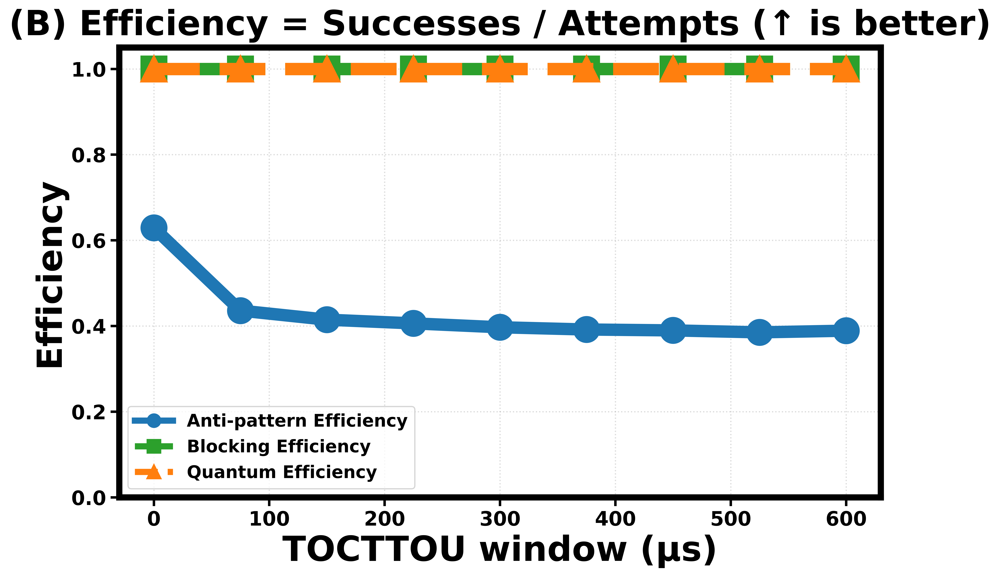

Saved: figs_pc_single/C_runtime.png (DPI=360)
Saved: figs_pc_single/C_runtime.pdf


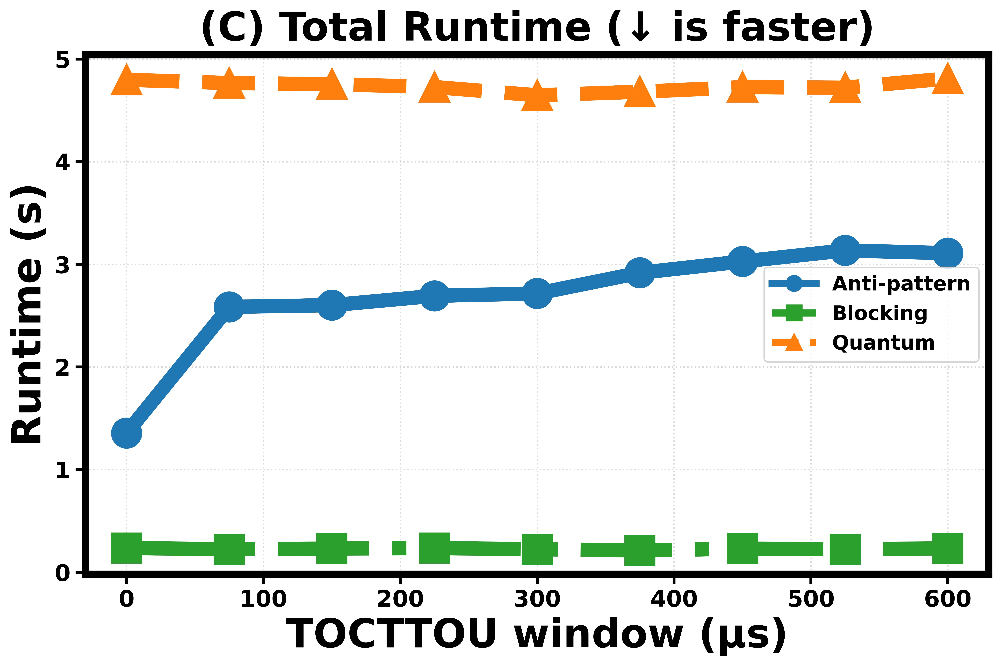

Saved: figs_pc_single/D_wait_cost.png (DPI=360)
Saved: figs_pc_single/D_wait_cost.pdf


In [10]:
import threading, queue, random, time, math, csv, os, json
from collections import Counter
import numpy as np
import matplotlib as mpl
mpl.rcParams.update({
    "figure.dpi": 800, "savefig.dpi": 800,
    "axes.grid": True, "grid.linestyle": ":", "grid.alpha": 0.45,
    "axes.titlesize": 12, "axes.labelsize": 11, "legend.fontsize": 9,
    "xtick.labelsize": 10, "ytick.labelsize": 10, "axes.unicode_minus": False,
   
    "font.size": 16,          
    "axes.titlesize": 28,     
    "axes.labelsize": 28,     
    "xtick.labelsize": 16,    
    "ytick.labelsize": 16,
    "legend.fontsize": 16,

   
    "font.weight": "bold",
    "axes.titleweight": "bold",
    "axes.labelweight": "bold",

    
    "lines.linewidth": 10,   
    "lines.markersize": 20,
    "lines.markeredgewidth": 1.8,

  
    "axes.linewidth": 5,        
    "xtick.major.width": 2.0,     
    "ytick.major.width": 2.0,
    "xtick.major.size": 7,        
    "ytick.major.size": 7,

    "errorbar.capsize": 5,    

    "grid.linewidth": 1.0,
})

    
import matplotlib.pyplot as plt
import pennylane as qml

# ---------- Output / Cache ----------
SAVE_DIR  = "figs_pc_single"
CACHE_NPZ = "pc_results_cache.npz"
CSV_OUT   = "pc_quantum_vs_classical_table.csv"
FIG_DPI   = 360
SAVE_PNG  = True
SAVE_PDF  = True
os.makedirs(SAVE_DIR, exist_ok=True)

def save_and_show(fig, name):
    """Save high-DPI PNG + vector PDF, then show & close."""
    if SAVE_PNG:
        fig.savefig(os.path.join(SAVE_DIR, f"{name}.png"), dpi=FIG_DPI, bbox_inches="tight")
    if SAVE_PDF:
        fig.savefig(os.path.join(SAVE_DIR, f"{name}.svg"), bbox_inches="tight")
    print(f"Saved: {os.path.join(SAVE_DIR, name)}.png (DPI={FIG_DPI})")
    if SAVE_PDF:
        print(f"Saved: {os.path.join(SAVE_DIR, name)}.pdf")
    plt.show(); plt.close(fig)

# ---------------- Config ----------------
SEED = 7
np.random.seed(SEED); rng0 = random.Random(SEED)

# Multi-producer / Multi-consumer
N_PROD = 4
N_CONS = 4
ITEMS_PER_THREAD = 500
BUFSIZE = 1
TOCTTOU_GRID = np.linspace(0, 6e-4, 9)   # 0 .. 600 μs
N_REPEATS = 7
ERR_MODE = "ci95"                        # or 'std'

# Align quantum steps to total classical operations
QUANTUM_STEPS = N_PROD * ITEMS_PER_THREAD

# ---------------- Helpers ----------------
def jain_index(vals_dict):
    """
    Jain’s fairness index over a dict of counts:
        J = (Σx)^2 / (n Σx^2) ∈ [1/n, 1]
    It becomes ~1 when all participants receive similar shares.
    """
    xs = np.array(list(vals_dict.values()), float)
    den = len(xs) * (xs**2).sum()
    return (xs.sum()**2/den) if den>0 else 1.0

def mean_err(vals, mode=ERR_MODE):
    """Return (mean, error) where error is sample std or ~95% CI = 1.96*SEM."""
    vals = np.asarray(vals, float); m = float(vals.mean())
    if len(vals) == 1: return m, 0.0
    sd = float(vals.std(ddof=1))
    if mode == "std": return m, sd
    sem = sd / math.sqrt(len(vals)); return m, 1.96*sem

def agg_grid(arrs):
    """
    Aggregate a grid of lists (one list per TOCTTOU point) into mean ± error arrays.
    Input:  [ [rep1, rep2, ...] for each grid point]
    Output: (means, errors) as NumPy arrays.
    """
    m, e = [], []
    for v in arrs:
        mv, ev = mean_err(np.array(v))
        m.append(mv); e.append(ev)
    return np.array(m), np.array(e)

# ---------------- Classical 1: anti-pattern ----------------
def classical_anti_multi(tocttou, items_per_thread=ITEMS_PER_THREAD,
                         n_prod=N_PROD, n_cons=N_CONS, seed=SEED):
    """
    Classical “check-then-act” anti-pattern:
      if not full(): put_nowait(...)
      if not empty(): get_nowait(...)
    A TOCTTOU window is inserted between check and use, creating races.

    We track per-thread:
      - attempts[(role, tid)]: each time a thread *decides to act* after a check.
      - success[(role, tid)]: successful put/get.
      - mism[(role, tid)]: a race mismatch (e.g., put on Full).
    """
    q = queue.Queue(maxsize=BUFSIZE)
    start = threading.Barrier(n_prod + n_cons)
    attempts = Counter(); success = Counter(); mism = Counter()

    def P_thread(tid):
        local = random.Random(seed + 100*tid)
        produced = 0; start.wait()
        while produced < items_per_thread:
            if not q.full():                          # (intentional anti-pattern)
                attempts[('P',tid)] += 1
                time.sleep(local.uniform(0, tocttou)) # TOCTTOU exposure
                try:
                    q.put_nowait(1)
                    success[('P',tid)] += 1; produced += 1
                except queue.Full:
                    mism[('P',tid)] += 1

    def C_thread(tid):
        local = random.Random(seed + 200*tid)
        consumed = 0; start.wait()
        while consumed < items_per_thread:
            if not q.empty():                         # (intentional anti-pattern)
                attempts[('C',tid)] += 1
                time.sleep(local.uniform(0, tocttou))
                try:
                    _ = q.get_nowait()
                    success[('C',tid)] += 1; consumed += 1
                except queue.Empty:
                    mism[('C',tid)] += 1

    threads = [threading.Thread(target=P_thread, args=(i,)) for i in range(n_prod)] + \
              [threading.Thread(target=C_thread, args=(i,)) for i in range(n_cons)]
    t0 = time.perf_counter()
    for t in threads: t.start()
    for t in threads: t.join()
    wall = time.perf_counter() - t0

    att = sum(attempts.values()); mis = sum(mism.values()); suc = sum(success.values())
    viol = 100.0*mis/max(1,att)                       # violation percentage
    eff  = suc/max(1,att)                             # NEW: efficiency = successes / attempts
    fairness = jain_index(success if success else {0:1})
    return {"viol%": viol, "runtime": wall, "throughput": suc/max(1e-12,wall),
            "fairness": fairness, "efficiency": eff,
            "attempts": att, "mism": mis, "succ": suc}

# ---------------- Classical 2: blocking ----------------
def classical_blocking_multi(items_per_thread=ITEMS_PER_THREAD,
                             n_prod=N_PROD, n_cons=N_CONS, seed=SEED):
    """
    Correct monitor semantics:
      • put() blocks when the queue is full,
      • get() blocks when the queue is empty.

    We add `attempts[(role, tid)]` so that Efficiency = successes/attempts is meaningful.
    In a correct blocking queue, each loop performs exactly one attempt and succeeds,
    hence efficiency ≈ 1 (differences are only timing, not correctness).
    """
    q = queue.Queue(maxsize=BUFSIZE)
    start = threading.Barrier(n_prod + n_cons)
    success = Counter(); waits = []; attempts = Counter()

    def P_thread(tid):
        start.wait()
        for _ in range(items_per_thread):
            attempts[('P',tid)] += 1
            t0 = time.perf_counter()
            q.put(1)                        # blocks if full
            waits.append(time.perf_counter() - t0)
            success[('P',tid)] += 1

    def C_thread(tid):
        start.wait()
        for _ in range(items_per_thread):
            attempts[('C',tid)] += 1
            t0 = time.perf_counter()
            _ = q.get()                     # blocks if empty
            waits.append(time.perf_counter() - t0)
            success[('C',tid)] += 1

    threads = [threading.Thread(target=P_thread, args=(i,)) for i in range(n_prod)] + \
              [threading.Thread(target=C_thread, args=(i,)) for i in range(n_cons)]
    t0 = time.perf_counter()
    for t in threads: t.start()
    for t in threads: t.join()
    wall = time.perf_counter() - t0

    att = sum(attempts.values()); suc = sum(success.values())
    fairness = jain_index(success if success else {0:1})
    wait_mean_us = (np.mean(waits)*1e6) if waits else 0.0
    eff  = suc/max(1,att)                  # ~1.0
    return {"viol%": 0.0, "runtime": wall, "throughput": (len(waits))/max(1e-12,wall),
            "fairness": fairness, "wait_mean_us": wait_mean_us, "efficiency": eff,
            "attempts": att, "succ": suc}

# ---------------- Quantum paper circuit ----------------
dev_pc = qml.device("default.qubit", wires=3, shots=1)   # wires: [P,C,B]

@qml.qnode(dev_pc)
def pc_step(b):
    """
    Minimal “paper circuit” policy:
      B → C via CNOT makes C follow B;
      C → P via CNOT flips P iff C==1 → alternates P/C turns without blocking.
    Input state |P,C,B> = |1,0,b| ; returns one basis-state sample [p,c,b].
    """
    qml.BasisState(np.array([1,0,b], dtype=int), wires=[0,1,2])
    qml.CNOT(wires=[2,1])   # B -> C
    qml.CNOT(wires=[1,0])   # C -> P
    return qml.sample(wires=[0,1,2])

def quantum_paper(steps=QUANTUM_STEPS, b_init=0):
    """
    We count 'attempts' as each scheduled turn (determined by b).
    Successful turns are the alternations observed in the measurement.
    Efficiency = successes / attempts ≈ 1 (violations are rare).
    """
    b = b_init; P_turns = C_turns = 0; violations = 0
    attempts_total = 0

    t0 = time.perf_counter()
    for _ in range(steps):
        attempts_total += 1
        p, c, _ = pc_step(b)
        if b == 0 and (p,c)==(1,0): P_turns += 1; b = 1
        elif b == 1 and (p,c)==(0,1): C_turns += 1; b = 0
        else: violations += 1
    wall = time.perf_counter() - t0

    succ = P_turns + C_turns
    eff  = succ/max(1, attempts_total)
    return {"viol%": 100.0*violations/max(1,steps), "runtime": wall,
            "throughput": succ/max(1e-12,wall),
            "fairness": jain_index({"P":P_turns,"C":C_turns}),
            "wait_mean_us": 0.0, "efficiency": eff,
            "attempts": attempts_total, "succ": succ}

# ---------------- Simulation & aggregation ----------------
def simulate_and_aggregate():
    """
    Run N_REPEATS for each TOCTTOU value; aggregate into mean±error arrays.
    We keep your original series (violation/fairness/runtime/wait),
    and ADD efficiency series for the new panel (B).
    """
    anti_viol_all   = [[] for _ in TOCTTOU_GRID]
    anti_rt_all     = [[] for _ in TOCTTOU_GRID]
    anti_jain_all   = [[] for _ in TOCTTOU_GRID]
    anti_eff_all    = [[] for _ in TOCTTOU_GRID]  

    blk_viol_all    = [[] for _ in TOCTTOU_GRID]
    blk_rt_all      = [[] for _ in TOCTTOU_GRID]
    blk_jain_all    = [[] for _ in TOCTTOU_GRID]
    blk_wait_all    = [[] for _ in TOCTTOU_GRID]
    blk_eff_all     = [[] for _ in TOCTTOU_GRID]  

    q_viol_all      = [[] for _ in TOCTTOU_GRID]
    q_rt_all        = [[] for _ in TOCTTOU_GRID]
    q_jain_all      = [[] for _ in TOCTTOU_GRID]
    q_wait_all      = [[] for _ in TOCTTOU_GRID]
    q_eff_all       = [[] for _ in TOCTTOU_GRID]  

    print(f"Running repeats={N_REPEATS} ...")
    for rep in range(N_REPEATS):
        seed = SEED + 1000*rep
        for gi, w in enumerate(TOCTTOU_GRID):
            anti = classical_anti_multi(w, seed=seed+17*gi)
            blk  = classical_blocking_multi(seed=seed+29*gi)
            qp   = quantum_paper()

            anti_viol_all[gi].append(anti["viol%"]);   anti_rt_all[gi].append(anti["runtime"]);   anti_jain_all[gi].append(anti["fairness"]);    anti_eff_all[gi].append(anti["efficiency"])
            blk_viol_all[gi].append(blk["viol%"]);     blk_rt_all[gi].append(blk["runtime"]);     blk_jain_all[gi].append(blk["fairness"]);      blk_wait_all[gi].append(blk["wait_mean_us"]); blk_eff_all[gi].append(blk["efficiency"])
            q_viol_all[gi].append(qp["viol%"]);        q_rt_all[gi].append(qp["runtime"]);        q_jain_all[gi].append(qp["fairness"]);         q_wait_all[gi].append(qp["wait_mean_us"]);    q_eff_all[gi].append(qp["efficiency"])

    # Convert lists → (mean, error) arrays
    anti_viol_m, anti_viol_e = agg_grid(anti_viol_all)
    blk_viol_m,  blk_viol_e  = agg_grid(blk_viol_all)
    q_viol_m,    q_viol_e    = agg_grid(q_viol_all)

    anti_jain_m, anti_jain_e = agg_grid(anti_jain_all)
    blk_jain_m,  blk_jain_e  = agg_grid(blk_jain_all)
    q_jain_m,    q_jain_e    = agg_grid(q_jain_all)

    # NEW: efficiency
    anti_eff_m, anti_eff_e = agg_grid(anti_eff_all)
    blk_eff_m,  blk_eff_e  = agg_grid(blk_eff_all)
    q_eff_m,    q_eff_e    = agg_grid(q_eff_all)

    anti_rt_m, anti_rt_e     = agg_grid(anti_rt_all)
    blk_rt_m,  blk_rt_e      = agg_grid(blk_rt_all)
    q_rt_m,    q_rt_e        = agg_grid(q_rt_all)

    blk_wait_m, blk_wait_e   = agg_grid(blk_wait_all)
    q_wait_m,  q_wait_e      = agg_grid(q_wait_all)

    xs_us = TOCTTOU_GRID*1e6  # for x-axis in μs

    return dict(
        xs_us=xs_us,
        anti_viol_m=anti_viol_m, anti_viol_e=anti_viol_e,
        blk_viol_m=blk_viol_m,   blk_viol_e=blk_viol_e,
        q_viol_m=q_viol_m,       q_viol_e=q_viol_e,

        anti_jain_m=anti_jain_m, anti_jain_e=anti_jain_e,
        blk_jain_m=blk_jain_m,   blk_jain_e=blk_jain_e,
        q_jain_m=q_jain_m,       q_jain_e=q_jain_e,

        # NEW: efficiency series for panel (B)
        anti_eff_m=anti_eff_m, anti_eff_e=anti_eff_e,
        blk_eff_m=blk_eff_m,   blk_eff_e=blk_eff_e,
        q_eff_m=q_eff_m,       q_eff_e=q_eff_e,

        anti_rt_m=anti_rt_m, anti_rt_e=anti_rt_e,
        blk_rt_m=blk_rt_m,   blk_rt_e=blk_rt_e,
        q_rt_m=q_rt_m,       q_rt_e=q_rt_e,

        blk_wait_m=blk_wait_m, blk_wait_e=blk_wait_e,
        q_wait_m=q_wait_m,   q_wait_e=q_wait_e
    )

# ---------------- Cache I/O ----------------
def save_cache(res, path=CACHE_NPZ):
    """Save compressed NPZ + a compact CSV for quick inspection."""
    np.savez_compressed(path, **res)
    print(f"Saved cache: {path}")

    rows = [["TOCTTOU_us",
             "Anti_Viol%±","Block_Viol%±","Quantum_Viol%±",
             "Anti_SuccessJain±","Block_SuccessJain±","Quantum_SuccessJain±",
             "Anti_Eff±","Block_Eff±","Quantum_Eff±",                      # NEW
             "Block_wait_us±","Quantum_wait_us±"]]
    for i in range(len(res["xs_us"])):
        rows.append([
            f"{res['xs_us'][i]:.0f}",
            f"{res['anti_viol_m'][i]:.2f}±{res['anti_viol_e'][i]:.2f}",
            f"{res['blk_viol_m'][i]:.2f}±{res['blk_viol_e'][i]:.2f}",
            f"{res['q_viol_m'][i]:.2f}±{res['q_viol_e'][i]:.2f}",
            f"{res['anti_jain_m'][i]:.3f}±{res['anti_jain_e'][i]:.3f}",
            f"{res['blk_jain_m'][i]:.3f}±{res['blk_jain_e'][i]:.3f}",
            f"{res['q_jain_m'][i]:.3f}±{res['q_jain_e'][i]:.3f}",
            f"{res['anti_eff_m'][i]:.3f}±{res['anti_eff_e'][i]:.3f}",
            f"{res['blk_eff_m'][i]:.3f}±{res['blk_eff_e'][i]:.3f}",
            f"{res['q_eff_m'][i]:.3f}±{res['q_eff_e'][i]:.3f}",
            f"{res['blk_wait_m'][i]:.1f}±{res['blk_wait_e'][i]:.1f}",
            f"{res['q_wait_m'][i]:.1f}±{res['q_wait_e'][i]:.1f}",
        ])
    w = [max(len(str(r[i])) for r in rows) for i in range(len(rows[0]))]
    print("\n=== Table (cached means ± errors) ===")
    print(" | ".join(rows[0][i].ljust(w[i]) for i in range(len(w))))
    for r in rows[1:]:
        print(" | ".join(str(r[i]).ljust(w[i]) for i in range(len(w))))
    with open(CSV_OUT, "w", newline="") as f:
        csv.writer(f).writerows(rows)
    print(f"Saved CSV: {CSV_OUT}")

def load_cache(path=CACHE_NPZ):
    """Load arrays from NPZ; raise if missing."""
    if not os.path.exists(path):
        raise FileNotFoundError(f"Cache not found: {path}. Run with MODE='simulate_and_plot' first.")
    data = dict(np.load(path))
    for k,v in data.items(): data[k] = np.array(v)
    print(f"Loaded cache: {path}")
    return data

# ---------------- Style (B updated to Efficiency) ----------------
DEFAULT_STYLE = {
    "titles": {
        "A": "(A) Violation Probability vs TOCTTOU Window (↓ is better)",
        "B": "(B) Efficiency = Successes / Attempts (↑ is better)",  # UPDATED
        "C": "(C) Total Runtime (↓ is faster)",
        "D": "(D) Mean Waiting Time vs TOCTTOU Window (↓ is better)",
    },
    "xlabels": {
        "A": "TOCTTOU window (μs)", "B": "TOCTTOU window (μs)",
        "C": "TOCTTOU window (μs)", "D": "TOCTTOU window (μs)"
    },
    "ylabels": {
        "A": "Violation probability (%)",
        "B": "Efficiency",         # UPDATED
        "C": "Runtime (s)",
        "D": "Mean waiting time (μs)"
    },
    "ylims": {
        "A": [0, 100],
        "B": [0, 1.05],   # Efficiency is in [0,1]; add a little headroom
        "C": None,
        "D": [0, None]
    },
    "series": {
      "A": {
        "anti":   {"label":"Classical Anti-pattern", "marker":"o", "linestyle":"-",  "capsize":3, "color": "#1F77B4"},
        "block":  {"label":"Classical Blocking",     "marker":"s", "linestyle":"-.",  "capsize":3, "color": "#2CA02C"},
        "quant":  {"label":"Quantum",                "marker":"^", "linestyle":"--",  "capsize":3, "color": "#FF7F0E"},
      },
      "B": {  # UPDATED: Efficiency curves
        "anti":   {"label":"Anti-pattern Efficiency", "marker":"o", "linestyle":"-",  "capsize":3, "color": "#1F77B4"},
        "block":  {"label":"Blocking Efficiency",     "marker":"s", "linestyle":"-.",  "capsize":3, "color": "#2CA02C"},
        "quant":  {"label":"Quantum Efficiency",      "marker":"^", "linestyle":"--",  "capsize":3, "color": "#FF7F0E"},
      },
      "C": {
        "anti":   {"label":"Anti-pattern", "marker":"o", "linestyle":"-", "capsize":3, "color": "#1F77B4"},
        "block":  {"label":"Blocking",     "marker":"s", "linestyle":"-.", "capsize":3, "color": "#2CA02C"},
        "quant":  {"label":"Quantum",      "marker":"^", "linestyle":"--", "capsize":3, "color": "#FF7F0E"},
      },
      "D": {
        "block":  {"label":"Blocking mean wait (μs)", "marker":"s", "linestyle":"-.", "capsize":3, "color": "#2CA02C"},
        "quant":  {"label":"Quantum mean wait (μs)",  "marker":"^", "linestyle":"--", "capsize":3, "color": "#FF7F0E"},
      }
    },
    "subtitle": lambda: ("")
}

def deep_merge(a: dict, b: dict):
    """Recursive dict merge to overlay user STYLE/style.json onto DEFAULT_STYLE."""
    for k, v in b.items():
        if isinstance(v, dict) and isinstance(a.get(k), dict):
            deep_merge(a[k], v)
        else:
            a[k] = v

def load_style(style: dict=None, style_json_path: str=None):
    """Return the effective style dict (DEFAULT_STYLE merged with user overrides and optional JSON)."""
    import copy
    out = copy.deepcopy(DEFAULT_STYLE)
    if style is not None: deep_merge(out, style)
    if style_json_path and os.path.isfile(style_json_path):
        with open(style_json_path, "r", encoding="utf-8") as f:
            user = json.load(f)
        deep_merge(out, user)
    return out

# ---------------- Plotting ----------------
def plot_from_results(res, style: dict=None, style_json_path: str=None):
    """Render panels A–D from aggregated arrays and the style system (no recompute)."""
    S = load_style(style, style_json_path)
    xs = res["xs_us"]; subtitle = S["subtitle"]()

    # (A) Violation
    figA = plt.figure(figsize=(10, 7)); ax = figA.add_subplot(111)
    sA = S["series"]["A"]
    ax.plot(xs, res["anti_viol_m"], marker=sA["anti"]["marker"], 
                linestyle=sA["anti"]["linestyle"], linewidth=10, markersize=20,
                color=sA["anti"]["color"], label=sA["anti"]["label"])
    ax.plot(xs, res["blk_viol_m"],  marker=sA["block"]["marker"],
                linestyle=sA["block"]["linestyle"], linewidth=10, markersize=20,
                color=sA["block"]["color"], label=sA["block"]["label"])
    ax.plot(xs, res["q_viol_m"],    marker=sA["quant"]["marker"],
                linestyle=sA["quant"]["linestyle"], linewidth=10, markersize=20,
                color=sA["quant"]["color"], label=sA["quant"]["label"])
    ax.set_xlabel(S["xlabels"]["A"]); ax.set_ylabel(S["ylabels"]["A"])
    if S["ylims"]["A"]: ax.set_ylim(*S["ylims"]["A"])
    ax.set_title(S["titles"]["A"], pad=10); ax.legend(); figA.suptitle(subtitle, y=0.99, fontsize=10)
    leg = ax.legend(markerscale=0.5,   
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)

    for ln in leg.get_lines():      
        ln.set_linewidth(5)
    plt.tight_layout(); save_and_show(figA, "A_correctness_vs_tocttou")


    figB = plt.figure(figsize=(10, 7)); ax = figB.add_subplot(111)
    sB = S["series"]["B"]
    ax.plot(xs, res["anti_eff_m"], marker=sB["anti"]["marker"],
                linestyle=sB["anti"]["linestyle"],
                color=sB["anti"]["color"], label=sB["anti"]["label"])
    ax.plot(xs, res["blk_eff_m"],  marker=sB["block"]["marker"],
                linestyle=sB["block"]["linestyle"],
                color=sB["block"]["color"], label=sB["block"]["label"])
    ax.plot(xs, res["q_eff_m"],    marker=sB["quant"]["marker"],
                linestyle=sB["quant"]["linestyle"],
                color=sB["quant"]["color"], label=sB["quant"]["label"])
    ax.set_xlabel(S["xlabels"]["B"]); ax.set_ylabel(S["ylabels"]["B"])
    if S["ylims"]["B"]: ax.set_ylim(*S["ylims"]["B"])
    ax.set_title(S["titles"]["B"], pad=10); ax.legend(); figB.suptitle(subtitle, y=0.99, fontsize=10)
    leg = ax.legend(markerscale=0.5,  
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)

    for ln in leg.get_lines():      
        ln.set_linewidth(5)
    plt.tight_layout(); save_and_show(figB, "B_efficiency")

    # (C) Runtime
    figC = plt.figure(figsize=(10, 7)); ax = figC.add_subplot(111)
    sC = S["series"]["C"]
    ax.plot(xs, res["anti_rt_m"], marker=sC["anti"]["marker"],
                linestyle=sC["anti"]["linestyle"],
                color=sC["anti"]["color"], label=sC["anti"]["label"])
    ax.plot(xs, res["blk_rt_m"],  marker=sC["block"]["marker"],
                linestyle=sC["block"]["linestyle"],
                color=sC["block"]["color"], label=sC["block"]["label"])
    ax.plot(xs, res["q_rt_m"],    marker=sC["quant"]["marker"],
                linestyle=sC["quant"]["linestyle"],
                color=sC["quant"]["color"], label=sC["quant"]["label"])
    ax.set_xlabel(S["xlabels"]["C"]); ax.set_ylabel(S["ylabels"]["C"])
    if S["ylims"]["C"]: ax.set_ylim(*S["ylims"]["C"])
    ax.set_title(S["titles"]["C"], pad=10); ax.legend(); figC.suptitle(subtitle, y=0.99, fontsize=10)
    leg = ax.legend(markerscale=0.5,   
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)

    for ln in leg.get_lines():      
        ln.set_linewidth(5)
    plt.tight_layout(); save_and_show(figC, "C_runtime")

    # (D) Wait cost
    figD = plt.figure(figsize=(10, 7)); ax = figD.add_subplot(111)
    sD = S["series"]["D"]
    ax.plot(xs, res["blk_wait_m"], marker=sD["block"]["marker"],
                linestyle=sD["block"]["linestyle"],
                color=sD["block"]["color"], label=sD["block"]["label"])
    ax.plot(xs, res["q_wait_m"],   marker=sD["quant"]["marker"],
                linestyle=sD["quant"]["linestyle"],
                color=sD["quant"]["color"], label=sD["quant"]["label"])
    ax.set_xlabel(S["xlabels"]["D"]); ax.set_ylabel(S["ylabels"]["D"])
    if S["ylims"]["D"]: ax.set_ylim(*S["ylims"]["D"])
    ax.set_title(S["titles"]["D"], pad=10); ax.legend(); figD.suptitle(subtitle, y=0.99, fontsize=10)
    leg = ax.legend(markerscale=0.5,   
                    fontsize=14,
                    frameon=True, handlelength=2.2, handletextpad=0.8, borderpad=0.4)

    for ln in leg.get_lines():     
        ln.set_linewidth(5)
    plt.tight_layout(); save_and_show(figD, "D_wait_cost")

# ---------------- Main ----------------
def main(mode="simulate_and_plot", style=None, style_json_path=None):
    """
    Modes:
      - "simulate_and_plot": run heavy loops, cache arrays to NPZ, then render figures.
      - "plot_only":         load cached arrays and render figures only (no recompute).
    """
    if mode == "simulate_and_plot":
        res = simulate_and_aggregate()
        save_cache(res, CACHE_NPZ)
        plot_from_results(res, style, style_json_path)
    elif mode == "plot_only":
        res = load_cache(CACHE_NPZ)
        plot_from_results(res, style, style_json_path)
    else:
        raise ValueError("mode must be 'simulate_and_plot' or 'plot_only'")

if __name__ == "__main__":
    # First run computes & plots; switch to "plot_only" for styling without recompute.
    MODE = "plot_only"
    STYLE = {
        # You can unify colors or override titles here if needed.
        # "series": {
        #   "A": {"anti":{"color":"C3"}, "block":{"color":"C0"}, "quant":{"color":"C2"}},
        #   "B": {"anti":{"color":"C3"}, "block":{"color":"C0"}, "quant":{"color":"C2"}},
        #   "C": {"anti":{"color":"C3"}, "block":{"color":"C0"}, "quant":{"color":"C2"}},
        #   "D": {"block":{"color":"C0"}, "quant":{"color":"C2"}}
        # }
    }
    STYLE_JSON_PATH = None  # or path to your "style.json"
    main(MODE, STYLE, STYLE_JSON_PATH)